In [172]:
import pandas as pd
import numpy as np
import seaborn
import matplotlib
import statistics
from sklearn.decomposition import PCA
from sklearn.decomposition import KernelPCA
from sklearn.manifold import TSNE
from sklearn.manifold import MDS
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
import math
import glob
from itertools import combinations
from matplotlib import pyplot as plt
from Bio import Phylo
import biotite
from pca_plot import *
#from vst_function import *
from stattools.resampling import PermutationTest
from scipy import stats
from pyranges import PyRanges
import seaborn as sns

In [173]:
## Read and merge files 
anotation = pd.read_table('/Users/luciabazan/Downloads/biosample_table.tsv')

ids_hg19 = pd.DataFrame()
ids_hg19['Sample'] = anotation['Sample']
ids_hg19['Region'] = anotation['Superpopulation']


In [224]:
# is not working 
#chm13 = pd.read_csv('../call_cnvr_chm13/individual_cnv_cnvr.txt', sep='\t')
chm13 = pd.read_table('/Users/luciabazan/Documents/GitHub/cnv_sgdp/call_cnvr_t2t_hprc/individual_cnv_cnvr.txt')

chm13

,Chr,Start,End,CNVR_ID,Sample_ID,CNV_Start,CNV_End,CNV_Value,Length
0,1,3620.0,3696.0,CNVR_2,HG01975,3634,3696,0,63
1,1,3620.0,3696.0,CNVR_2,HG01975,3634,3696,0,63
2,1,11669.0,11728.0,CNVR_5,HG01975,11669,11728,2,60
3,1,22961.0,23124.0,CNVR_6,HG01975,22961,23059,2,99
4,1,156352.0,344468.0,CNVR_20,HG01975,215871,215926,1,56
...,...,...,...,...,...,...,...,...,...
4751371,22,5779811.0,10659118.0,CNVR_78068,HG03239,7336428,7447058,1,110631
4751372,22,5779811.0,10659118.0,CNVR_78068,HG03239,7559688,7584649,4,24962
4751373,22,5779811.0,10659118.0,CNVR_78068,HG03239,9714162,9716432,2,2271
4751374,22,11878314.0,11920501.0,CNVR_78177,HG03239,11878314,11891604,2,13291


raw_data = pd.read_csv('/Users/luciabazan/hprc-t2t-cnvs.csv')


## Keeping only samples that are on old cnvs 
raw_data = raw_data.merge(ids_hg19, right_on=['Sample'], left_on=['Sample_ID'])

#change to df when using telomeres and centromeres filtration
final_cnv = raw_data.pivot_table(index=["Chr", "Start", "End"], 
                    columns='Sample_ID', 
                    values='CNV_Value',
                        fill_value=2).reset_index()


final_cnv.rename(columns={"Chr": "Chromosome"}, inplace=True)
final_cnv 




In [225]:
chm13 = chm13.dropna()
chm13['CNV_Value'].max()


93

In [226]:
## Keeping only samples that are on old cnvs 
chm13 = chm13.merge(ids_hg19, right_on=['Sample'], left_on=['Sample_ID'])
chm13


,Chr,Start,End,CNVR_ID,Sample_ID,CNV_Start,CNV_End,CNV_Value,Length,Sample,Region
0,1,3620.0,3696.0,CNVR_2,HG01975,3634,3696,0,63,HG01975,AMR
1,1,3620.0,3696.0,CNVR_2,HG01975,3634,3696,0,63,HG01975,AMR
2,1,11669.0,11728.0,CNVR_5,HG01975,11669,11728,2,60,HG01975,AMR
3,1,22961.0,23124.0,CNVR_6,HG01975,22961,23059,2,99,HG01975,AMR
4,1,156352.0,344468.0,CNVR_20,HG01975,215871,215926,1,56,HG01975,AMR
...,...,...,...,...,...,...,...,...,...,...,...
4087331,22,5779811.0,10659118.0,CNVR_78068,HG03239,7180507,7185972,3,5466,HG03239,SAS
4087332,22,5779811.0,10659118.0,CNVR_78068,HG03239,7336428,7447058,1,110631,HG03239,SAS
4087333,22,5779811.0,10659118.0,CNVR_78068,HG03239,7559688,7584649,4,24962,HG03239,SAS
4087334,22,5779811.0,10659118.0,CNVR_78068,HG03239,9714162,9716432,2,2271,HG03239,SAS


In [227]:
#REMOVE SAMPLES WITH ABERRATIONS
#samples_with_aberrations = ['LP6005441-DNA_B03', ' LP6005443-DNA_G01', 'LP6005441-DNA_G09', 'LP6005441-DNA_D04'] 

#chm13 = chm13[~chm13.Sample.isin(samples_with_aberrations)]

#chm13.drop(columns='individuals', inplace= True)
chm13#.value_counts(by=["Sample_ID"])
chm13.columns = ['Chromosome', 'Start', 'End', 'CNVR_ID', 'Sample', 'CNV_start', 'CNV_end', 'CNV_Value','Length', 'Sample','Region']
chm13

,Chromosome,Start,End,CNVR_ID,Sample,CNV_start,CNV_end,CNV_Value,Length,Sample,Region
0,1,3620.0,3696.0,CNVR_2,HG01975,3634,3696,0,63,HG01975,AMR
1,1,3620.0,3696.0,CNVR_2,HG01975,3634,3696,0,63,HG01975,AMR
2,1,11669.0,11728.0,CNVR_5,HG01975,11669,11728,2,60,HG01975,AMR
3,1,22961.0,23124.0,CNVR_6,HG01975,22961,23059,2,99,HG01975,AMR
4,1,156352.0,344468.0,CNVR_20,HG01975,215871,215926,1,56,HG01975,AMR
...,...,...,...,...,...,...,...,...,...,...,...
4087331,22,5779811.0,10659118.0,CNVR_78068,HG03239,7180507,7185972,3,5466,HG03239,SAS
4087332,22,5779811.0,10659118.0,CNVR_78068,HG03239,7336428,7447058,1,110631,HG03239,SAS
4087333,22,5779811.0,10659118.0,CNVR_78068,HG03239,7559688,7584649,4,24962,HG03239,SAS
4087334,22,5779811.0,10659118.0,CNVR_78068,HG03239,9714162,9716432,2,2271,HG03239,SAS


In [228]:
## Selecting just individuals from tree


In [229]:
#chm13 = pd.read_csv('../data/chm13_gene_regions.csv', index_col=0)
chm13['Lenght'] = chm13['End'] - chm13['Start']
chm13

chm13 = chm13[chm13['Lenght'] < 1000000] # 2000000
chm13 = chm13[chm13['Lenght'] > 1000]
chm13



,Chromosome,Start,End,CNVR_ID,Sample,CNV_start,CNV_end,CNV_Value,Length,Sample,Region,Lenght
4,1,156352.0,344468.0,CNVR_20,HG01975,215871,215926,1,56,HG01975,AMR,188116.0
5,1,156352.0,344468.0,CNVR_20,HG01975,243491,243588,1,98,HG01975,AMR,188116.0
6,1,156352.0,344468.0,CNVR_20,HG01975,251399,251434,1,36,HG01975,AMR,188116.0
7,1,156352.0,344468.0,CNVR_20,HG01975,268421,268463,2,43,HG01975,AMR,188116.0
8,1,156352.0,344468.0,CNVR_20,HG01975,282586,282635,1,50,HG01975,AMR,188116.0
...,...,...,...,...,...,...,...,...,...,...,...,...
4087323,20,32018935.0,32944046.0,CNVR_74750,HG03239,32819862,32836785,2,16924,HG03239,SAS,925111.0
4087324,20,32018935.0,32944046.0,CNVR_74750,HG03239,32878581,32882706,2,4126,HG03239,SAS,925111.0
4087325,21,6649304.0,6852856.0,CNVR_76392,HG03239,6677331,6685988,3,8658,HG03239,SAS,203552.0
4087326,21,9988996.0,10016215.0,CNVR_76534,HG03239,10003430,10016215,3,12786,HG03239,SAS,27219.0


In [230]:
### Plotiing distribution

deletions = chm13[chm13 ['CNV_Value'] < 2]
deletions['type'] = 'Deletion'
duplications = chm13[chm13['CNV_Value'] > 2]
duplications['type'] = 'Duplication'


distribution = pd.concat([deletions,duplications])

/var/folders/05/4pfxtbrs5459ytz3j1jhcgt00000gn/T/ipykernel_3856/3828576368.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deletions['type'] = 'Deletion'
/var/folders/05/4pfxtbrs5459ytz3j1jhcgt00000gn/T/ipykernel_3856/3828576368.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  duplications['type'] = 'Duplication'


In [231]:
chm13.columns = ['Chromosome','Start','End','CNVR_ID,','Sample_ID','CNV_Start','CNV_End','CNV_Value','Length','Sample','Region', 'Lenght']

In [232]:
chm13

,Chromosome,Start,End,"CNVR_ID,",Sample_ID,CNV_Start,CNV_End,CNV_Value,Length,Sample,Region,Lenght
4,1,156352.0,344468.0,CNVR_20,HG01975,215871,215926,1,56,HG01975,AMR,188116.0
5,1,156352.0,344468.0,CNVR_20,HG01975,243491,243588,1,98,HG01975,AMR,188116.0
6,1,156352.0,344468.0,CNVR_20,HG01975,251399,251434,1,36,HG01975,AMR,188116.0
7,1,156352.0,344468.0,CNVR_20,HG01975,268421,268463,2,43,HG01975,AMR,188116.0
8,1,156352.0,344468.0,CNVR_20,HG01975,282586,282635,1,50,HG01975,AMR,188116.0
...,...,...,...,...,...,...,...,...,...,...,...,...
4087323,20,32018935.0,32944046.0,CNVR_74750,HG03239,32819862,32836785,2,16924,HG03239,SAS,925111.0
4087324,20,32018935.0,32944046.0,CNVR_74750,HG03239,32878581,32882706,2,4126,HG03239,SAS,925111.0
4087325,21,6649304.0,6852856.0,CNVR_76392,HG03239,6677331,6685988,3,8658,HG03239,SAS,203552.0
4087326,21,9988996.0,10016215.0,CNVR_76534,HG03239,10003430,10016215,3,12786,HG03239,SAS,27219.0


In [233]:
#change to df when using telomeres and centromeres filtration
final_cnv = chm13.pivot_table(index=["Chromosome", "Start", "End"], 
                    columns='Sample', 
                    values='CNV_Value',
                        fill_value=2).reset_index()


final_cnv

Sample,Chromosome,Start,End,HG00097,HG00099,HG00126,HG00128,HG00133,HG00140,HG00146,...,NA20809,NA20827,NA20850,NA20870,NA20905,NA21093,NA21102,NA21106,NA21110,NA21144
0,1,736.0,3272.0,1.0,2.0,2.000000,1.0,2.000000,1.0,1.0,...,2.0,2.0,2.0,2.0,1.0,2.0,2.0,2.0,2.0,2.0
1,1,24123.0,26129.0,1.0,2.0,2.000000,1.5,1.000000,2.0,2.0,...,2.0,1.0,2.0,2.0,2.0,1.0,1.0,2.0,1.0,2.0
2,1,34674.0,134000.0,2.0,2.0,1.333333,1.0,1.444444,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,0.0,2.0
3,1,139890.0,140991.0,2.0,2.0,2.000000,2.0,2.000000,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
4,1,151553.0,153659.0,2.0,2.0,2.000000,2.0,2.000000,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12310,9,150493245.0,150494904.0,2.0,2.0,2.000000,2.0,2.000000,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
12311,9,150539980.0,150547555.0,1.0,2.0,2.000000,2.0,1.000000,2.0,0.0,...,2.0,1.0,2.0,2.0,2.0,2.0,0.0,2.0,1.0,0.0
12312,9,150547891.0,150549071.0,2.0,2.0,2.000000,2.0,2.000000,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
12313,9,150549961.0,150551513.0,2.0,2.0,2.000000,0.0,1.000000,2.0,2.0,...,2.0,2.0,2.0,2.0,1.0,2.0,2.0,2.0,2.0,2.0


In [219]:
#change to df when using telomeres and centromeres filtration
final_cnv = chm13.pivot_table(index=["Chromosome", "CNV_Start", "CNV_End"], 
                    columns='Sample', 
                    values='CNV_Value',
                        fill_value=2).reset_index()


final_cnv.rename(columns={"CNV_Start": "Start", "CNV_End": "End"}, inplace=True)

        component_1  component_2  component_3  component_4  component_5  \
Region                                                                    
EUR      -48.354800     0.206450     0.052911     0.329800     0.188412   
EUR        0.151579    -0.582010     0.147720    -0.001891    -0.299091   
EUR        0.389212    -0.845983     0.061809     0.484552    -0.335173   
EUR        0.312110     0.140379    -0.205042     0.728542     0.321922   
EUR       -0.082407     0.144808    -0.372391    -0.114186     0.528434   
...             ...          ...          ...          ...          ...   
SAS        0.341067    -1.269979     0.558603    -0.431768     0.014478   
SAS       -0.201760     0.297959    -0.415573    -0.072369     0.001676   
SAS        0.265433    -2.119681     1.360520    -1.485512     3.473823   
SAS        0.342944    -0.968840     0.416005    -0.170191     0.059771   
SAS        0.218004    -0.401971     0.655602    -0.069725    -0.417565   

        component_6  com

/var/folders/05/4pfxtbrs5459ytz3j1jhcgt00000gn/T/ipykernel_3856/2124056540.py:115: FutureWarning: Creating a Groupby object with a length-1 list-like level parameter will yield indexes as tuples in a future version. To keep indexes as scalars, create Groupby objects with a scalar level parameter instead.
  for name, group in groups:
/var/folders/05/4pfxtbrs5459ytz3j1jhcgt00000gn/T/ipykernel_3856/2124056540.py:132: FutureWarning: Creating a Groupby object with a length-1 list-like level parameter will yield indexes as tuples in a future version. To keep indexes as scalars, create Groupby objects with a scalar level parameter instead.
  for name, group in groups:


array([0.02732449, 0.01653518, 0.01564546, 0.01506234, 0.01485004,
       0.01411745, 0.01385418, 0.01318899, 0.01301978, 0.012654  ])

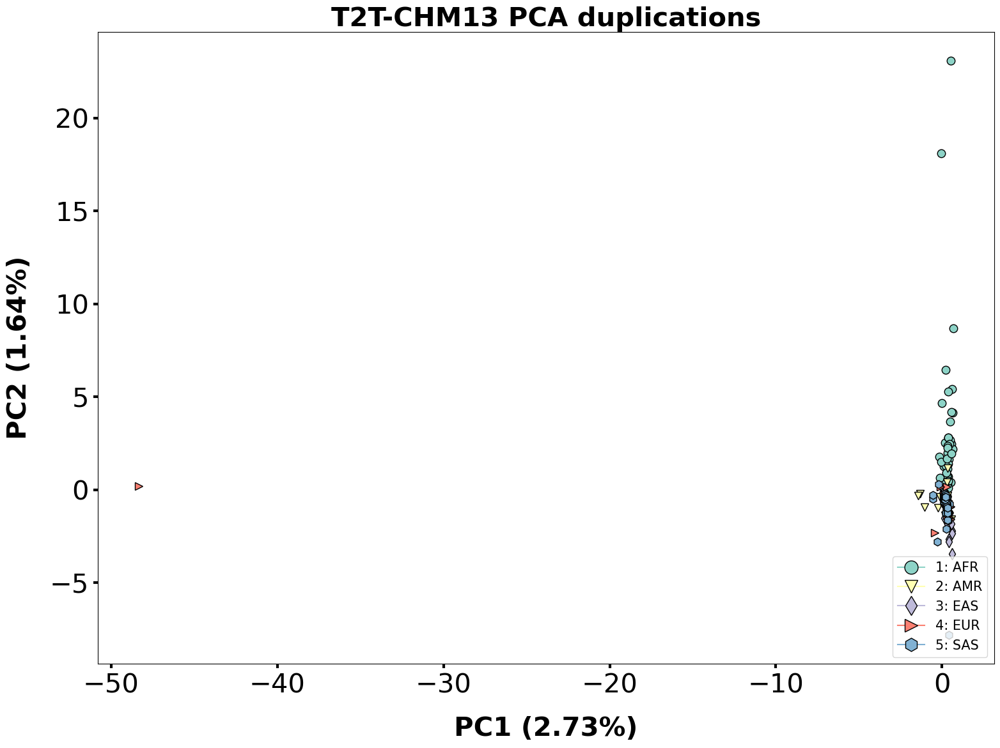

In [240]:
### DUPLICATIONS

counts = final_cnv.iloc[:,3:287].T
features = ids_hg19.set_index('Sample').merge(counts, left_index=True, right_index=True)
features = features.loc[:,['Region']]
features = features.sort_index()
features 

#duplications
counts = counts.T 
counts = counts[(counts[counts.columns[1:]]>1).all(axis=1)]
#final[(final[final.columns[1:]]<3).all(axis=1)]
counts = counts.T
counts = counts.sort_index()
counts 

#PCA
x = StandardScaler().fit_transform(counts)
pca = PCA(n_components=10)
pca_results = pca.fit_transform(x)

df_pca= pd.DataFrame(pca_results,
                          columns=['component_1','component_2', 'component_3', 'component_4',
                                  'component_5',
                                  'component_6',
                                  'component_7',
                                  'component_8',
                                  'component_9',
                                   'component_10'
                                  ],
                          index=features.index)




df_pca = features.merge(df_pca, left_index=True, right_index=True)


plot_scatter_cluster_shape(data=df_pca, abscissa='component_1', ordinate='component_2', label_horizontal='PC1 (2.73%)', label_vertical='PC2 (1.64%)', factor='Region', fonts=define_font_properties(), colors=define_color_properties(), legend=True)
plt.title("T2T-CHM13 PCA duplications", size=30, fontweight="bold")
pca.explained_variance_ratio_

In [243]:

## DELETIONS
counts = final_cnv.iloc[:,3:287].T
features = ids_hg19.set_index('Sample').merge(counts, left_index=True, right_index=True)
features = features.loc[:,['Region']]
features = features.sort_index()
features 

#deletions
counts = counts.T 
counts = counts[(counts[counts.columns[1:]]<3).all(axis=1)]

counts = counts.T
counts = counts.sort_index()
counts

,0,2,3,4,5,7,9,10,11,13,...,12299,12301,12304,12305,12306,12307,12309,12311,12312,12314
Sample,,,,,,,,,,,,,,,,,,,,,
HG00097,1.0,2.000000,2.0,2.0,0.500000,2.0,2.0,2.000000,0.0,2.0,...,2.000000,1.333333,1.250000,2.0,2.0,2.0,2.0,1.0,2.0,2.0
HG00099,2.0,2.000000,2.0,2.0,1.000000,2.0,2.0,1.000000,2.0,2.0,...,2.000000,2.000000,2.000000,2.0,1.0,2.0,2.0,2.0,2.0,2.0
HG00126,2.0,1.333333,2.0,2.0,1.000000,2.0,2.0,1.000000,2.0,2.0,...,2.000000,2.000000,2.000000,2.0,1.0,2.0,2.0,2.0,2.0,2.0
HG00128,1.0,1.000000,2.0,2.0,0.500000,2.0,2.0,1.000000,2.0,2.0,...,2.000000,1.000000,1.000000,2.0,2.0,2.0,2.0,2.0,2.0,2.0
HG00133,2.0,1.444444,2.0,2.0,1.090909,2.0,2.0,1.000000,0.0,2.0,...,2.000000,2.000000,1.500000,2.0,2.0,2.0,2.0,1.0,2.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
NA21093,2.0,2.000000,2.0,2.0,0.625000,2.0,2.0,1.555556,2.0,2.0,...,1.666667,2.000000,1.666667,2.0,1.0,2.0,2.0,2.0,2.0,2.0
NA21102,2.0,2.000000,2.0,2.0,0.800000,2.0,2.0,2.000000,2.0,2.0,...,2.000000,2.000000,1.500000,2.0,1.5,2.0,2.0,0.0,2.0,2.0
NA21106,2.0,2.000000,2.0,2.0,0.500000,2.0,2.0,2.000000,2.0,2.0,...,2.000000,2.000000,2.000000,2.0,1.0,0.0,2.0,2.0,2.0,2.0


        component_1  component_2  component_3  component_4  component_5  \
Region                                                                    
EUR       12.018018    13.908988    -3.874825    -0.215533     0.459620   
EUR       11.738583    15.790089    14.446406     2.600146    -0.480355   
EUR       12.654153    18.621188    -5.367983    -1.741303    -0.012852   
EUR       11.152947    15.345893    -5.284802     0.189945     1.351811   
EUR        9.428383    15.167230    -6.175473     0.489646     0.448727   
...             ...          ...          ...          ...          ...   
SAS       12.365173     6.011822    -6.009668     0.677391    -1.021069   
SAS       11.158578     7.936408    -5.669666     2.207056    -0.257857   
SAS       10.294191     6.054298    -5.705169     1.337822    -1.674220   
SAS       11.156074     5.260142    -5.665010     1.334146    -0.637814   
SAS       12.181260     3.579277    -4.586010     0.481958    -2.205595   

        component_6  com

/var/folders/05/4pfxtbrs5459ytz3j1jhcgt00000gn/T/ipykernel_3856/2124056540.py:115: FutureWarning: Creating a Groupby object with a length-1 list-like level parameter will yield indexes as tuples in a future version. To keep indexes as scalars, create Groupby objects with a scalar level parameter instead.
  for name, group in groups:
/var/folders/05/4pfxtbrs5459ytz3j1jhcgt00000gn/T/ipykernel_3856/2124056540.py:132: FutureWarning: Creating a Groupby object with a length-1 list-like level parameter will yield indexes as tuples in a future version. To keep indexes as scalars, create Groupby objects with a scalar level parameter instead.
  for name, group in groups:


array([0.03531103, 0.01281245, 0.00995348, 0.00936027, 0.00882407,
       0.00849477, 0.00829098, 0.00817268, 0.00802758, 0.00800725])

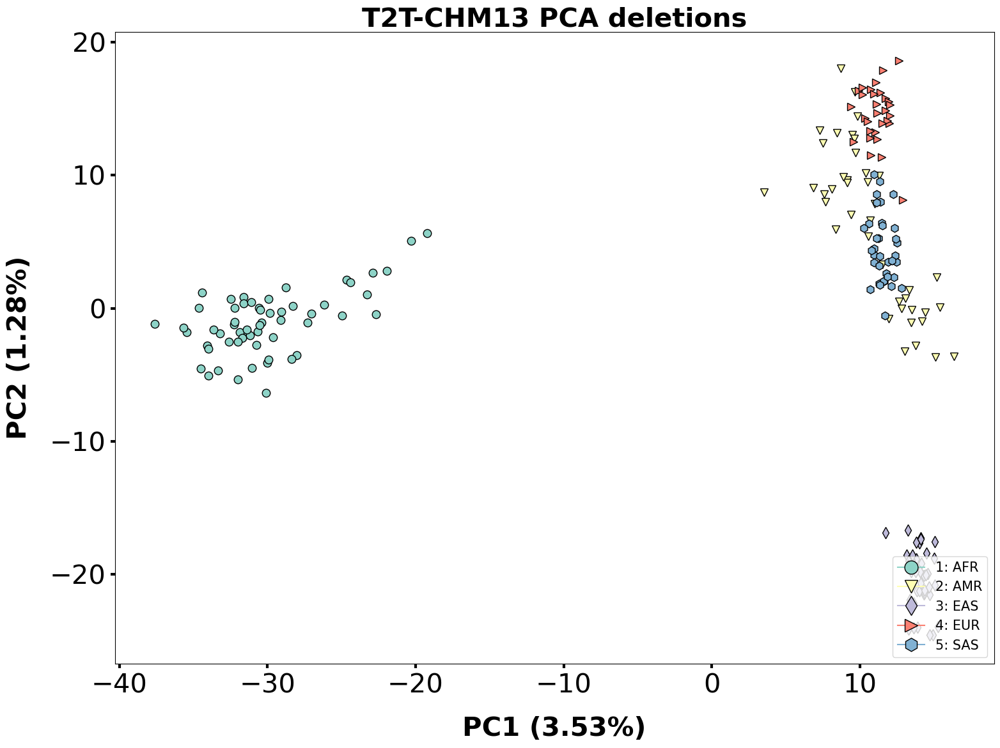

In [238]:
x = StandardScaler().fit_transform(counts)
pca = PCA(n_components=10)
pca_results = pca.fit_transform(x)

df_pca= pd.DataFrame(pca_results,
                          columns=['component_1','component_2', 'component_3', 'component_4',
                                  'component_5',
                                  'component_6',
                                  'component_7',
                                  'component_8',
                                  'component_9',
                                   'component_10'
                                  ],
                          index=features.index)




df_pca = features.merge(df_pca, left_index=True, right_index=True)


#components = [1,2,3,4,5,6,7,8,9,10]

#combinations_components = list(combinations(components,2))
#for i in combinations_components:
#    plot_scatter_cluster_shape(data=df_pca, abscissa='component_'+str(i[0]), ordinate='component_'+str(i[1]), label_horizontal='PC '+ str(i[0]), label_vertical='PC '+str(i[1]), factor='Region', fonts=define_font_properties(), colors=define_color_properties(), legend=True)
    #print(str(i[0]))

plot_scatter_cluster_shape(data=df_pca, abscissa='component_1', ordinate='component_2', label_horizontal='PC1 (3.53%)', label_vertical='PC2 (1.28%)', factor='Region', fonts=define_font_properties(), colors=define_color_properties(), legend=True)
plt.title("T2T-CHM13 PCA deletions", size=30, fontweight="bold")
pca.explained_variance_ratio_

<h1> Removing cnvs from exclusion regions 

In [144]:
black_header = ['Chromosome','Start', 'End', 'Type', 'Extra1', 'Extra2']
blacklist = pd.read_table('/Users/luciabazan/Downloads/T2T.excluderanges.bed', names=black_header)
blacklist['Chromosome'] = blacklist['Chromosome'].str.replace('chr', '')
blacklist = blacklist.drop(columns=['Extra1', 'Extra2'])
blacklist_ranges = PyRanges(blacklist)

In [145]:
final_cnv_ranges = PyRanges(final_cnv)
final_cnv = final_cnv_ranges.overlap(blacklist_ranges, invert=True)
final_cnv = final_cnv.as_df()
cnvs = final_cnv
#cnvs['Chromosome'] = 'chr' + cnvs['Chromosome'].astype(str)
#cnvs.to_csv('../data/T2TCHM13_cnvrs.csv')
cnvs

Sample_ID,Chromosome,Start,End,HG00097,HG00099,HG00126,HG00128,HG00133,HG00140,HG00146,...,NA20809,NA20827,NA20850,NA20870,NA20905,NA21093,NA21102,NA21106,NA21110,NA21144
0,1,260184,262698,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
1,1,268402,268458,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
2,1,268421,268463,0.0,2.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,2.0,0.0,1.0,0.0,1.0,1.0
3,1,268453,268509,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
4,1,282586,282635,0.0,2.0,1.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,1.0,2.0,0.0,1.0,0.0,1.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
384328,Y,62454489,62455562,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
384329,Y,62454800,62455855,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
384330,Y,62454807,62455636,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
384331,Y,62455287,62455605,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0


In [146]:
coordinates = final_cnv.iloc[:,0:3]
#coordinates.to_csv('../data/t2t_cnvr_coordinates.bed', sep='\t', header=False, index=False)
final_cnv

Sample_ID,Chromosome,Start,End,HG00097,HG00099,HG00126,HG00128,HG00133,HG00140,HG00146,...,NA20809,NA20827,NA20850,NA20870,NA20905,NA21093,NA21102,NA21106,NA21110,NA21144
0,1,260184,262698,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
1,1,268402,268458,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
2,1,268421,268463,0.0,2.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,2.0,0.0,1.0,0.0,1.0,1.0
3,1,268453,268509,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
4,1,282586,282635,0.0,2.0,1.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,1.0,2.0,0.0,1.0,0.0,1.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
384328,Y,62454489,62455562,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
384329,Y,62454800,62455855,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
384330,Y,62454807,62455636,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
384331,Y,62455287,62455605,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0


<h1> PCA 

In [147]:
counts = final_cnv.iloc[:,3:287].T
features = ids_hg19.set_index('Sample').merge(counts, left_index=True, right_index=True)
features = features.loc[:,['Region']]
features = features.sort_index()
features 

,Region
HG00097,EUR
HG00099,EUR
HG00126,EUR
HG00128,EUR
HG00133,EUR
...,...
NA21093,SAS
NA21102,SAS
NA21106,SAS
NA21110,SAS


<h1> VST

In [148]:
#coordinates = input_vst.iloc[:,0:2]
cnvs = final_cnv.iloc[:,3:287]
cnvs = cnvs.T
cnvs = cnvs.fillna(2)
cnvs

,0,1,2,3,4,5,6,7,8,9,...,384323,384324,384325,384326,384327,384328,384329,384330,384331,384332
Sample_ID,,,,,,,,,,,,,,,,,,,,,
HG00097,2.0,2.0,0.0,2.0,0.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
HG00099,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
HG00126,2.0,2.0,1.0,2.0,1.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
HG00128,2.0,2.0,0.0,2.0,0.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
HG00133,2.0,2.0,0.0,2.0,1.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
NA21093,2.0,2.0,0.0,2.0,0.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
NA21102,2.0,2.0,1.0,2.0,1.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
NA21106,2.0,2.0,0.0,2.0,0.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0


In [149]:
dt = features.merge(cnvs, left_index=True, right_index=True)
dt

,Region,0,1,2,3,4,5,6,7,8,...,384323,384324,384325,384326,384327,384328,384329,384330,384331,384332
HG00097,EUR,2.0,2.0,0.0,2.0,0.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
HG00099,EUR,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
HG00126,EUR,2.0,2.0,1.0,2.0,1.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
HG00128,EUR,2.0,2.0,0.0,2.0,0.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
HG00133,EUR,2.0,2.0,0.0,2.0,1.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
NA21093,SAS,2.0,2.0,0.0,2.0,0.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
NA21102,SAS,2.0,2.0,1.0,2.0,1.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
NA21106,SAS,2.0,2.0,0.0,2.0,0.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
NA21110,SAS,2.0,2.0,1.0,2.0,1.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0


<h1> New Vst

In [150]:
####### Groupby regions #######
dt_group = dt.groupby('Region')

dt_groupped = []
regions = features['Region'].unique()
regions.sort()
for i in regions:
    dt_groupped.append(dt_group.get_group(str(i)))

dt_groupped

[        Region    0    1    2    3    4    5    6    7    8  ...  384323  \
 HG01884    AFR  2.0  2.0  2.0  2.0  2.0  2.0  2.0  2.0  2.0  ...     2.0   
 HG01891    AFR  2.0  2.0  2.0  2.0  1.0  2.0  2.0  2.0  2.0  ...     2.0   
 HG01960    AFR  2.0  2.0  2.0  1.0  1.0  2.0  2.0  2.0  2.0  ...     2.0   
 HG02257    AFR  2.0  2.0  1.0  2.0  1.0  2.0  2.0  2.0  2.0  ...     2.0   
 HG02258    AFR  2.0  2.0  2.0  2.0  1.0  2.0  2.0  2.0  2.0  ...     2.0   
 HG02280    AFR  2.0  2.0  2.0  2.0  2.0  2.0  2.0  2.0  2.0  ...     2.0   
 HG02451    AFR  2.0  2.0  2.0  2.0  2.0  2.0  2.0  2.0  2.0  ...     2.0   
 HG02486    AFR  2.0  2.0  0.0  2.0  0.0  2.0  2.0  2.0  2.0  ...     2.0   
 HG02559    AFR  2.0  2.0  2.0  2.0  2.0  2.0  2.0  2.0  2.0  ...     2.0   
 HG02572    AFR  2.0  2.0  2.0  2.0  2.0  2.0  2.0  2.0  2.0  ...     2.0   
 HG02583    AFR  2.0  2.0  2.0  2.0  0.0  2.0  2.0  2.0  1.0  ...     2.0   
 HG02615    AFR  2.0  2.0  2.0  2.0  2.0  2.0  2.0  2.0  2.0  ...     2.0   

In [151]:
#### Names to pair-population
regions = dt['Region'].unique()
regions.sort()
combination_names = []
for i in list(combinations(regions,2)):
    combination_names.append(i[0]+str('-')+i[1])

for j in dt_groupped:
    del j['Region']

regions

array(['AFR', 'AMR', 'EAS', 'EUR', 'SAS'], dtype=object)

In [152]:
## Function for Vst 
def vst_function(
    x=None, 
    y=None):

    vx = np.var(x, axis=0)
    vy = np.var(y, axis=0)

    nx = len(x)
    ny = len(y)

## Vt 
    a = np.concatenate((x,y))
    vt = np.ndarray.var(a,axis=0)

### Vs = (V1*n1+V2*n2)/(n1+n2) 

    v1 = vx*nx
    v2 = vy*ny
    ns = nx+ny
    vs = (v1+v2)/ ns
    ########## Vst #################
    #####(VT−VS)/VT
    
    vst = (vt-vs)/vt
    
    return(vst) 


combination_regions = list(combinations([0,1,2,3,4],2))

vst_list = []
for region in combination_regions:
    vx = np.var(dt_groupped[region[0]])
    vy = np.var(dt_groupped[region[1]])

    nx = len(dt_groupped[region[0]])
    ny = len(dt_groupped[region[1]])

## Vt 
    a = np.concatenate((dt_groupped[region[0]], dt_groupped[region[1]]))
    vt = np.ndarray.var(a,axis=0)

### Vs = (V1*n1+V2*n2)/(n1+n2) 

    v1 = vx*nx
    v2 = vy*ny
    ns = nx+ny
    vs = (v1+v2)/ ns
    ########## Vst #################
    #####(VT−VS)/VT
    
    vst = (vt-vs)/vt
    
    vst_list.append(vst)

/opt/anaconda3/lib/python3.12/site-packages/numpy/core/fromnumeric.py:3785: FutureWarning: The behavior of DataFrame.var with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return var(axis=axis, dtype=dtype, out=out, ddof=ddof, **kwargs)


In [153]:
## VST for pair-population
vst_dt = []

combination_regions = list(combinations([0,1,2,3,4],2))
for region in combination_regions:
        statistic = vst_function((dt_groupped[region[0]]), (dt_groupped[region[1]]))
        vst_dt.append(statistic)

vst_dt = pd.DataFrame(vst_dt).set_axis(combination_names)
vst_dt

,0,1,2,3,4,5,6,7,8,9,...,384323,384324,384325,384326,384327,384328,384329,384330,384331,384332
AFR-AMR,0.015997,NaN,0.336615,0.014575,0.055905,NaN,NaN,0.007213,0.062212,0.070690,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
AFR-EAS,0.152074,NaN,0.387000,0.014156,0.030169,0.031309,NaN,0.007004,0.086006,0.068770,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
AFR-EUR,0.024631,0.022222,0.483685,0.012029,0.153780,NaN,NaN,0.005945,0.073892,0.058926,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
AFR-SAS,0.027586,NaN,0.419699,0.013493,0.081207,NaN,NaN,0.006674,0.082260,0.065720,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
AMR-EAS,0.073271,NaN,0.001445,NaN,0.004765,0.026956,NaN,NaN,0.012041,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
AMR-EUR,0.067542,0.019524,0.021948,NaN,0.036941,NaN,NaN,NaN,0.010453,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
AMR-SAS,0.074201,NaN,0.007207,NaN,0.003674,NaN,NaN,NaN,0.011553,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
EAS-EUR,0.213675,0.019118,0.013494,NaN,0.067661,0.022962,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
EAS-SAS,0.230769,NaN,0.002432,NaN,0.016561,0.025290,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
EUR-SAS,NaN,0.018462,0.004360,NaN,0.017383,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [154]:
filtering_vst = pd.DataFrame(vst_dt)>=0.2
filtering_vst = filtering_vst.loc[:, filtering_vst.any()]
#filtering_vst = filtering_vst.set_axis(combination_names)
filtering_vst

,0,2,55,83,224,248,288,409,459,527,...,379379,379561,379793,380229,380981,381405,383953,384184,384185,384190
AFR-AMR,False,True,False,False,False,False,True,False,True,False,...,False,False,False,False,False,False,False,False,False,False
AFR-EAS,False,True,False,True,False,True,True,True,False,True,...,True,True,True,True,True,False,True,True,True,True
AFR-EUR,False,True,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
AFR-SAS,False,True,False,False,True,False,False,False,True,True,...,False,False,False,False,False,True,False,False,False,False
AMR-EAS,False,False,False,False,False,False,False,False,False,False,...,False,True,True,True,True,False,True,False,True,True
AMR-EUR,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
AMR-SAS,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
EAS-EUR,True,False,False,True,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,True,False
EAS-SAS,True,False,False,False,False,False,False,False,False,False,...,False,False,False,True,True,False,False,False,True,True
EUR-SAS,False,False,True,False,False,False,False,False,False,False,...,False,False,False,False,False,True,False,False,False,False


In [155]:
## Coordinates anotation 
vst_dt = vst_dt.T
vst_dt.insert (0, 'Chromosome', final_cnv['Chromosome'])
vst_dt.insert (1, 'Start', final_cnv['Start'])
vst_dt.insert (2, 'End', final_cnv['End'])
#vst_dt.insert (3, 'Type', final_cnv['Type'])
vst_dt = vst_dt.round(5)
vst_dt = vst_dt.replace(np.NaN, 0)
vst_dt

,Chromosome,Start,End,AFR-AMR,AFR-EAS,AFR-EUR,AFR-SAS,AMR-EAS,AMR-EUR,AMR-SAS,EAS-EUR,EAS-SAS,EUR-SAS
0,1,260184,262698,0.01600,0.15207,0.02463,0.02759,0.07327,0.06754,0.07420,0.21368,0.23077,0.00000
1,1,268402,268458,0.00000,0.00000,0.02222,0.00000,0.00000,0.01952,0.00000,0.01912,0.00000,0.01846
2,1,268421,268463,0.33662,0.38700,0.48368,0.41970,0.00145,0.02195,0.00721,0.01349,0.00243,0.00436
3,1,268453,268509,0.01458,0.01416,0.01203,0.01349,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000
4,1,282586,282635,0.05590,0.03017,0.15378,0.08121,0.00476,0.03694,0.00367,0.06766,0.01656,0.01738
...,...,...,...,...,...,...,...,...,...,...,...,...,...
384328,Y,62454489,62455562,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000
384329,Y,62454800,62455855,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000
384330,Y,62454807,62455636,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000
384331,Y,62455287,62455605,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000


In [156]:
#vst_dt.to_csv('../data/vst_cnvr_results_t2tchm13.csv', index=False)

In [157]:
vst_dt_filtered = vst_dt.iloc[filtering_vst.T.index]
vst_dt_filtered#.sort_values(by=['WestEurasia-Oceania'], ascending=False).head(50)
#vst_dt_filtered.to_csv('vst_cnvr_candidates_chm13t2t.csv', index=False)
vst_dt_filtered

,Chromosome,Start,End,AFR-AMR,AFR-EAS,AFR-EUR,AFR-SAS,AMR-EAS,AMR-EUR,AMR-SAS,EAS-EUR,EAS-SAS,EUR-SAS
0,1,260184,262698,0.01600,0.15207,0.02463,0.02759,0.07327,0.06754,0.07420,0.21368,0.23077,0.00000
2,1,268421,268463,0.33662,0.38700,0.48368,0.41970,0.00145,0.02195,0.00721,0.01349,0.00243,0.00436
55,1,337818,337850,0.00347,0.07353,0.13525,0.02088,0.05046,0.11306,0.04533,0.01089,0.16170,0.26369
83,1,393421,393497,0.10478,0.23556,0.00595,0.00126,0.02063,0.09730,0.07835,0.21368,0.18938,0.01282
224,1,406681,406898,0.13709,0.09693,0.10183,0.21005,0.00393,0.00058,0.00836,0.00116,0.02346,0.01183
...,...,...,...,...,...,...,...,...,...,...,...,...,...
381405,Y,31221896,31222046,0.04421,0.05685,0.00000,0.28722,0.00658,0.03228,0.16199,0.04199,0.09792,0.22890
383953,Y,61366759,61367049,0.00000,0.23016,0.00000,0.00000,0.20398,0.00000,0.00000,0.17857,0.19355,0.00000
384184,Y,61932436,61932566,0.00000,0.20995,0.00000,0.00000,0.18552,0.00000,0.00000,0.16194,0.17582,0.00000
384185,Y,61932436,61939714,0.00000,0.26554,0.00000,0.00000,0.23657,0.00000,0.00000,0.20817,0.22495,0.00000


In [158]:
#vst_dt_filtered.sort_values(by='Africa-America', ascending=False).head(50)

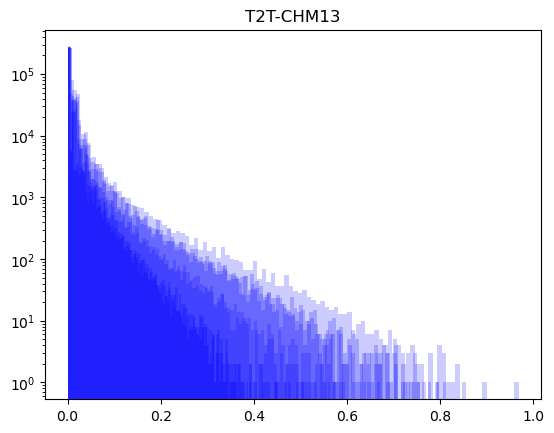

In [159]:
#sns.set_palette("bright")
for i in vst_dt.iloc[:,4:25].columns:
    plt.hist(vst_dt[i], bins=100, alpha=0.2, log=True,color="blue")
    plt.title('T2T-CHM13')
#    plt.savefig('../plots/t2t_chm13_vst_values_distribution.png', transparent=True)

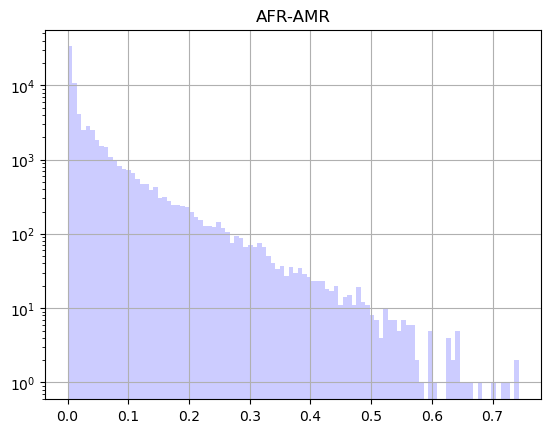

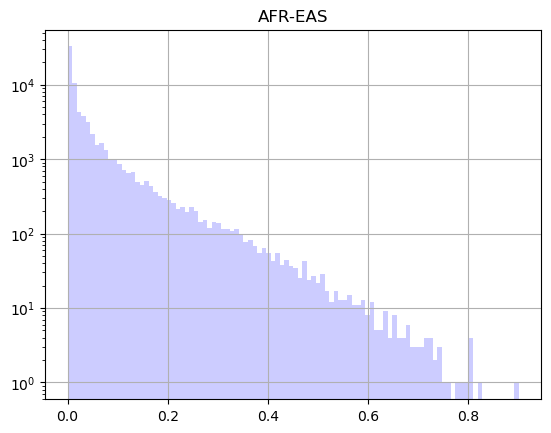

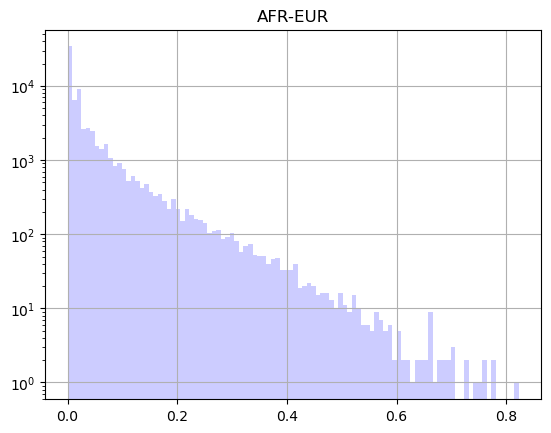

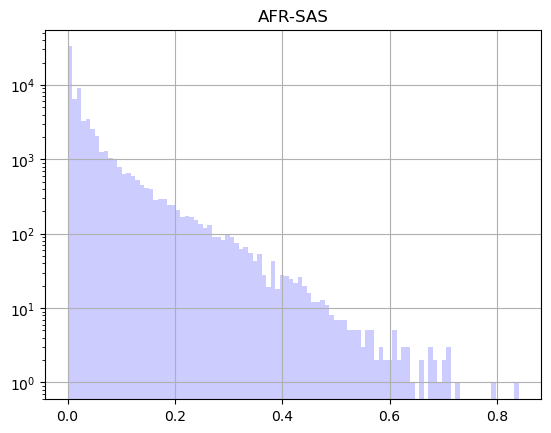

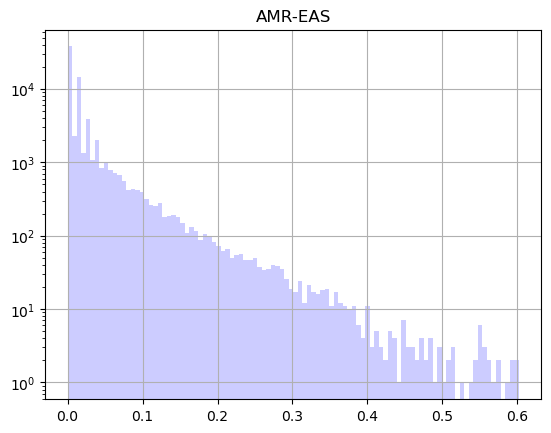

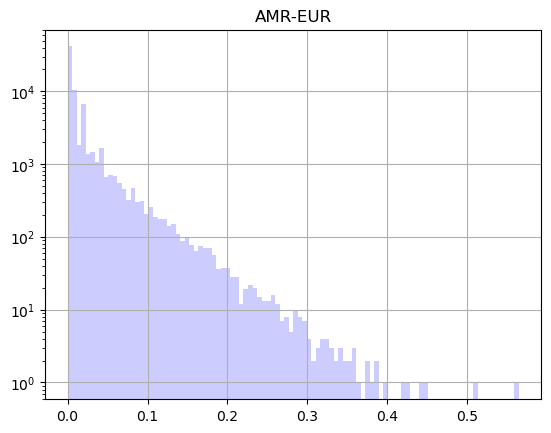

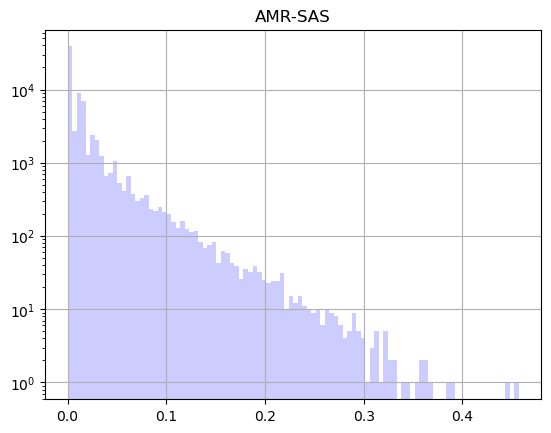

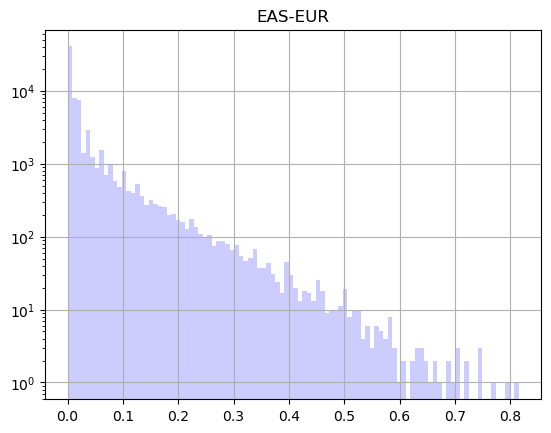

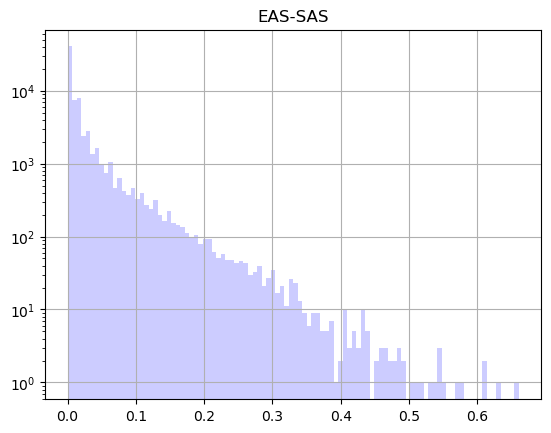

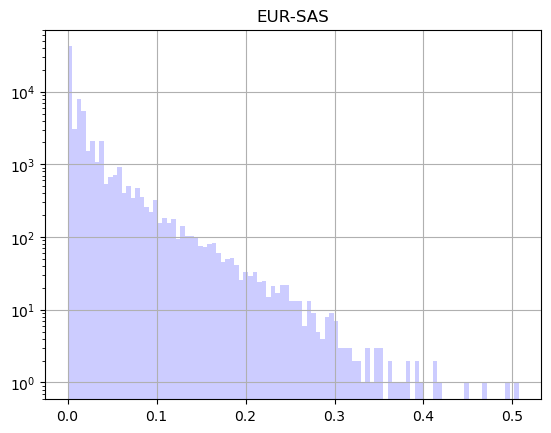

In [113]:
for col in vst_dt.iloc[:,3:25].columns: 
    try:      
        vst_dt.iloc[:,3:25][col] = pd.to_numeric(vst_dt.iloc[:,3:25][col]) 
        vst_dt.iloc[:,3:25].hist(column=col, bins=100, alpha=0.2, color="blue", log=True)
    except ValueError:
        print('This column can not be represented as a histogram')

<Axes: >

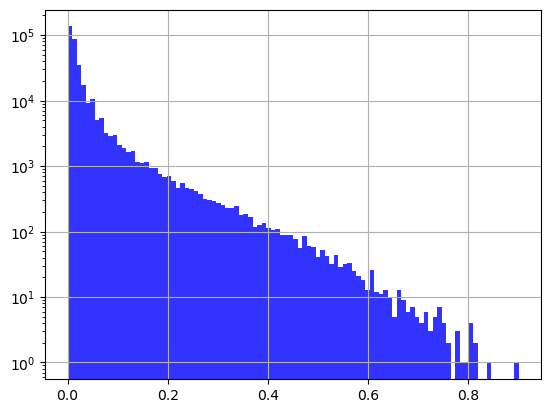

In [52]:
vst_dt.iloc[:,3:25].max(axis=1).hist(bins=100, alpha=0.8, log=True, color="blue")

In [88]:
#vst_dt[vst_dt['Type']=='duplication'].sort_values(by='Oceania-WestEurasia', ascending=False).head(200)

In [160]:
vst_dt_filtered = vst_dt.iloc[filtering_vst.T.index]
vst_dt_filtered#.sort_values(by=['WestEurasia-Oceania'], ascending=False).head(50)

,Chromosome,Start,End,AFR-AMR,AFR-EAS,AFR-EUR,AFR-SAS,AMR-EAS,AMR-EUR,AMR-SAS,EAS-EUR,EAS-SAS,EUR-SAS
0,1,260184,262698,0.01600,0.15207,0.02463,0.02759,0.07327,0.06754,0.07420,0.21368,0.23077,0.00000
2,1,268421,268463,0.33662,0.38700,0.48368,0.41970,0.00145,0.02195,0.00721,0.01349,0.00243,0.00436
55,1,337818,337850,0.00347,0.07353,0.13525,0.02088,0.05046,0.11306,0.04533,0.01089,0.16170,0.26369
83,1,393421,393497,0.10478,0.23556,0.00595,0.00126,0.02063,0.09730,0.07835,0.21368,0.18938,0.01282
224,1,406681,406898,0.13709,0.09693,0.10183,0.21005,0.00393,0.00058,0.00836,0.00116,0.02346,0.01183
...,...,...,...,...,...,...,...,...,...,...,...,...,...
381405,Y,31221896,31222046,0.04421,0.05685,0.00000,0.28722,0.00658,0.03228,0.16199,0.04199,0.09792,0.22890
383953,Y,61366759,61367049,0.00000,0.23016,0.00000,0.00000,0.20398,0.00000,0.00000,0.17857,0.19355,0.00000
384184,Y,61932436,61932566,0.00000,0.20995,0.00000,0.00000,0.18552,0.00000,0.00000,0.16194,0.17582,0.00000
384185,Y,61932436,61939714,0.00000,0.26554,0.00000,0.00000,0.23657,0.00000,0.00000,0.20817,0.22495,0.00000


In [161]:
## Saving Vst coordinates as bed file to liftover

#vst_dt_filtered.iloc[:,0:4].to_csv('vst_cnvrs_coordinates_chm13t2t.bed', header=False, index=False,sep='\t')
vst_dt_filtered

,Chromosome,Start,End,AFR-AMR,AFR-EAS,AFR-EUR,AFR-SAS,AMR-EAS,AMR-EUR,AMR-SAS,EAS-EUR,EAS-SAS,EUR-SAS
0,1,260184,262698,0.01600,0.15207,0.02463,0.02759,0.07327,0.06754,0.07420,0.21368,0.23077,0.00000
2,1,268421,268463,0.33662,0.38700,0.48368,0.41970,0.00145,0.02195,0.00721,0.01349,0.00243,0.00436
55,1,337818,337850,0.00347,0.07353,0.13525,0.02088,0.05046,0.11306,0.04533,0.01089,0.16170,0.26369
83,1,393421,393497,0.10478,0.23556,0.00595,0.00126,0.02063,0.09730,0.07835,0.21368,0.18938,0.01282
224,1,406681,406898,0.13709,0.09693,0.10183,0.21005,0.00393,0.00058,0.00836,0.00116,0.02346,0.01183
...,...,...,...,...,...,...,...,...,...,...,...,...,...
381405,Y,31221896,31222046,0.04421,0.05685,0.00000,0.28722,0.00658,0.03228,0.16199,0.04199,0.09792,0.22890
383953,Y,61366759,61367049,0.00000,0.23016,0.00000,0.00000,0.20398,0.00000,0.00000,0.17857,0.19355,0.00000
384184,Y,61932436,61932566,0.00000,0.20995,0.00000,0.00000,0.18552,0.00000,0.00000,0.16194,0.17582,0.00000
384185,Y,61932436,61939714,0.00000,0.26554,0.00000,0.00000,0.23657,0.00000,0.00000,0.20817,0.22495,0.00000


<h1> Deletions 

In [162]:
cnv_passed_vst = cnvs.T.iloc[filtering_vst.T.index]

cnv_passed_vst = cnv_passed_vst[(cnv_passed_vst[cnv_passed_vst.columns[1:]]<3).all(axis=1)]
cnv_passed_vst = cnv_passed_vst.T
counts = cnv_passed_vst
counts = counts.sort_index()
counts 

,0,2,55,83,224,248,288,409,459,527,...,379379,379561,379793,380229,380981,381405,383953,384184,384185,384190
Sample_ID,,,,,,,,,,,,,,,,,,,,,
HG00097,2.0,0.0,1.0,2.0,2.0,2.0,1.0,2.0,1.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
HG00099,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
HG00126,2.0,1.0,0.0,2.0,2.0,2.0,0.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
HG00128,2.0,0.0,1.0,2.0,2.0,2.0,1.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
HG00133,2.0,0.0,0.0,2.0,1.0,2.0,2.0,2.0,1.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
NA21093,2.0,0.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,1.0,2.0,2.0,2.0,2.0
NA21102,2.0,1.0,2.0,2.0,1.0,2.0,1.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
NA21106,2.0,0.0,2.0,2.0,2.0,2.0,0.0,1.0,1.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0


In [163]:
#PCA

x = StandardScaler().fit_transform(counts)
pca = PCA(n_components=10)
pca_results = pca.fit_transform(x)

df_pca= pd.DataFrame(pca_results,
                          columns=['component_1','component_2', 'component_3', 'component_4',
                                  'component_5',
                                  'component_6',
                                  'component_7',
                                  'component_8',
                                  'component_9',
                                   'component_10'
                                  ],
                          index=features.index)




df_pca = features.merge(df_pca, left_index=True, right_index=True)


## Removing CNVs with high variance 

cnv_high_variance = pd.DataFrame({'values':abs(pca.components_)[0], }).sort_values(by='values', ascending=False).head(150)
indexs = list(cnv_high_variance.index)
new_counts = counts.T.reset_index()

coordinates_high_variance = new_counts.iloc[indexs]
#coordinates_high_variance['index']
new_counts = new_counts.drop(new_counts.index[indexs])
#new_counts = new_counts.iloc[indexs]
new_counts = new_counts.drop(columns='index')
new_counts

In [195]:
def create_legend_elements(
colors=None,
labels=None,
markers=None,
):
    """
    Creates custom elements for legend.
    arguments:
        colors (list<dict>): colors
        labels (str): name of data column with independent variable
    raises:
    returns:
        (list<object>): elements for legend
    """
    import seaborn
    elements = []
    for index in range(len(labels)):
        element = matplotlib.lines.Line2D(
            [0],
            [0],
            marker=markers[index],
            color=colors[index],
            label=labels[index],
            markerfacecolor=colors[index],
            markeredgecolor='k',
            markersize=15,
        )
        elements.append(element)
    return elements

def plot_scatter_cluster_shape(
data=None,
abscissa=None,
ordinate=None,
label_horizontal=None,
label_vertical=None,
factor=None,
fonts=None,
colors=None,
legend=None,
):
    """
    Creates a figure of a chart of type histogram to represent the frequency
    distribution of a single series of values.
    arguments:
        data (object): Pandas data frame of groups, series, and values
        abscissa (str): name of data column with independent variable
        ordinate (str): name of data column with dependent variable
        label_horizontal (str): label for horizontal axis
        label_vertical (str): label for vertical axis
        factor (str): name of data column with groups or factors of samples
        fonts (dict<object>): references to definitions of font properties
        colors (dict<tuple>): references to definitions of color properties
        legend (bool): whether to include a legend for series on the chart
    raises:
    returns:
        (object): figure object
    """
##########
# Organize data.
# Separate points by groups.
# Define groups.
    
    import matplotlib
    data = data.copy(deep=True)   
    data.set_index(
        factor,
append=False,
drop=True,
inplace=True
    )
    print(data)
    groups = data.groupby(level=[factor])
    print("Count of groups by factor: " + str(len(groups)))
    import seaborn
    colors_series = list(seaborn.color_palette("Set3", n_colors=len(groups)))
    shape_series = list(['o','v','d','>','h','<','s'])
##########
# Create figure.
    figure = matplotlib.pyplot.figure(
    figsize=(15.748, 11.811),
    tight_layout=True
    )
# Create axes.
    axes = matplotlib.pyplot.axes()
    axes.set_xlabel(
    xlabel=label_horizontal,
labelpad=20,
alpha=1.0,
backgroundcolor=colors["white"],
color=colors["black"],
fontproperties=fonts["properties"]["one"]
    )
    axes.set_ylabel(
        ylabel=label_vertical,
        labelpad=20,
        alpha=1.0,
        backgroundcolor=colors["white"],
        color=colors["black"],
        fontproperties=fonts["properties"]["one"]
    )
    axes.tick_params(
        axis="both",
        which="both",
        direction="out",
        length=5.0,
        width=3.0,
        color=colors["black"],
        pad=5,
        labelsize=fonts["values"]["one"]["size"],
        labelcolor=colors["black"]
    )
# Plot points for values from each group.
    index = 0
    for name, group in groups:
        values_x = group[abscissa].to_list()
        values_y = group[ordinate].to_list()
        handle = axes.plot(
            values_x,
            values_y,
linestyle="",
marker= shape_series[index],
markersize=9, 
markeredgecolor=colors["black"],
markerfacecolor=colors_series[index] # colors["black"]
        )
        index += 1
        pass
# Plot labels for each group.
    labels = []
    index = 0
    for name, group in groups:
        values_x = group[abscissa].to_list()
        mean_x = statistics.median(values_x)
        values_y = group[ordinate].to_list()
        mean_y = statistics.median(values_y)
#        axes.text(
#            mean_x,
#            mean_y,
#str(index+1),
#backgroundcolor=colors["white_faint"],
#color=colors["black"],
#fontproperties=fonts["properties"]["three"],
#horizontalalignment="center",
#verticalalignment="center"
#        )
        label = str(index+1) + ": " + name
        labels.append(label)
        index += 1
        pass
# Create legend.
# Create custome elements for the legend
    elements = create_legend_elements(
colors=colors_series,
markers= shape_series,
labels=labels
    )
    axes.legend(
handles=elements,
loc="lower right",
prop=fonts["properties"]["four"],
    )
    return figure

        component_1  component_2  component_3  component_4  component_5  \
Region                                                                    
EUR       12.017998    13.970530    -3.638479    -0.606439     1.952135   
EUR       11.738593    15.732866    14.546520     3.397316    -1.542005   
EUR       12.654134    18.754596    -4.839674    -1.765857     1.434453   
EUR       11.152924    15.392608    -5.041657    -0.533070     3.135778   
EUR        9.428368    15.279693    -5.640638     0.110600     0.834903   
...             ...          ...          ...          ...          ...   
SAS       12.365169     6.148397    -5.741087     0.789693    -1.278554   
SAS       11.158595     8.005724    -5.299090     1.515203     1.261857   
SAS       10.294179     6.190926    -5.702658     0.992974    -1.715575   
SAS       11.156089     5.317513    -5.571484    -0.144386     0.256287   
SAS       12.181320     3.715373    -3.728783     0.429511    -2.170905   

        component_6  com

/var/folders/05/4pfxtbrs5459ytz3j1jhcgt00000gn/T/ipykernel_3856/2124056540.py:115: FutureWarning: Creating a Groupby object with a length-1 list-like level parameter will yield indexes as tuples in a future version. To keep indexes as scalars, create Groupby objects with a scalar level parameter instead.
  for name, group in groups:
/var/folders/05/4pfxtbrs5459ytz3j1jhcgt00000gn/T/ipykernel_3856/2124056540.py:132: FutureWarning: Creating a Groupby object with a length-1 list-like level parameter will yield indexes as tuples in a future version. To keep indexes as scalars, create Groupby objects with a scalar level parameter instead.
  for name, group in groups:
/var/folders/05/4pfxtbrs5459ytz3j1jhcgt00000gn/T/ipykernel_3856/2124056540.py:115: FutureWarning: Creating a Groupby object with a length-1 list-like level parameter will yield indexes as tuples in a future version. To keep indexes as scalars, create Groupby objects with a scalar level parameter instead.
  for name, group in gro

        component_1  component_2  component_3  component_4  component_5  \
Region                                                                    
EUR       12.017998    13.970530    -3.638479    -0.606439     1.952135   
EUR       11.738593    15.732866    14.546520     3.397316    -1.542005   
EUR       12.654134    18.754596    -4.839674    -1.765857     1.434453   
EUR       11.152924    15.392608    -5.041657    -0.533070     3.135778   
EUR        9.428368    15.279693    -5.640638     0.110600     0.834903   
...             ...          ...          ...          ...          ...   
SAS       12.365169     6.148397    -5.741087     0.789693    -1.278554   
SAS       11.158595     8.005724    -5.299090     1.515203     1.261857   
SAS       10.294179     6.190926    -5.702658     0.992974    -1.715575   
SAS       11.156089     5.317513    -5.571484    -0.144386     0.256287   
SAS       12.181320     3.715373    -3.728783     0.429511    -2.170905   

        component_6  com

/var/folders/05/4pfxtbrs5459ytz3j1jhcgt00000gn/T/ipykernel_3856/2124056540.py:115: FutureWarning: Creating a Groupby object with a length-1 list-like level parameter will yield indexes as tuples in a future version. To keep indexes as scalars, create Groupby objects with a scalar level parameter instead.
  for name, group in groups:
/var/folders/05/4pfxtbrs5459ytz3j1jhcgt00000gn/T/ipykernel_3856/2124056540.py:132: FutureWarning: Creating a Groupby object with a length-1 list-like level parameter will yield indexes as tuples in a future version. To keep indexes as scalars, create Groupby objects with a scalar level parameter instead.
  for name, group in groups:
/var/folders/05/4pfxtbrs5459ytz3j1jhcgt00000gn/T/ipykernel_3856/2124056540.py:115: FutureWarning: Creating a Groupby object with a length-1 list-like level parameter will yield indexes as tuples in a future version. To keep indexes as scalars, create Groupby objects with a scalar level parameter instead.
  for name, group in gro

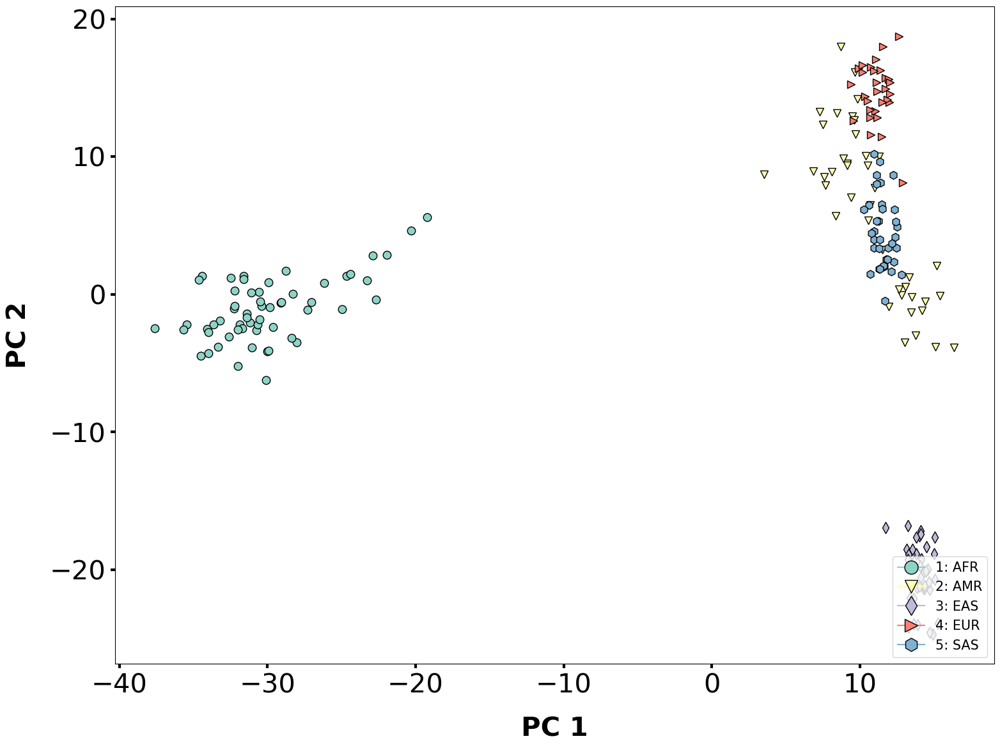

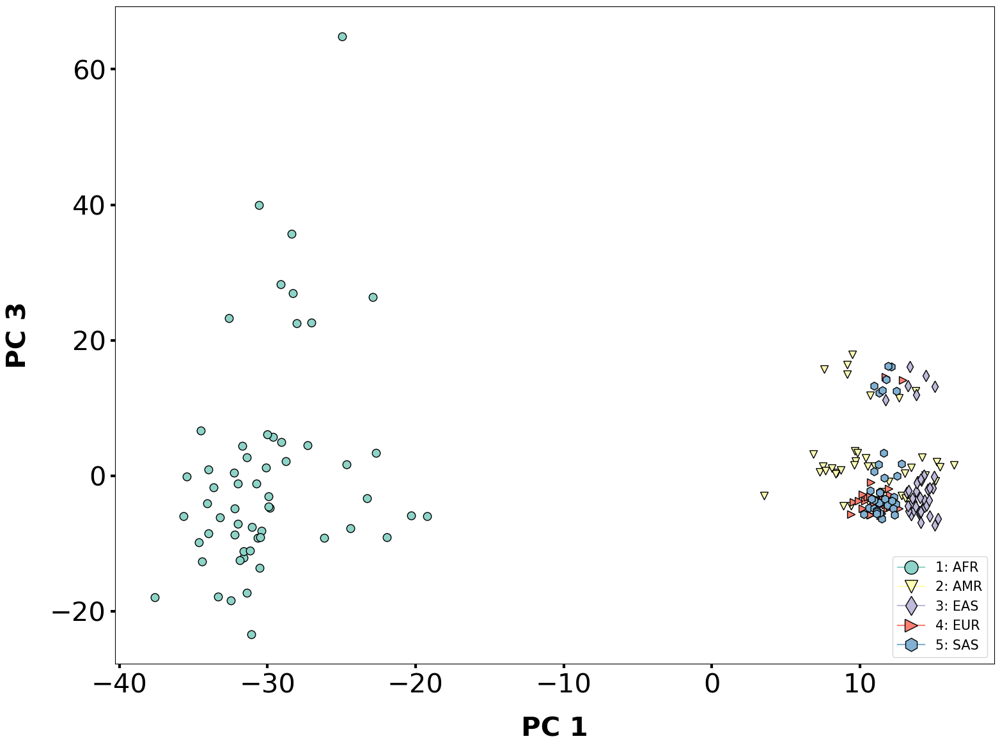

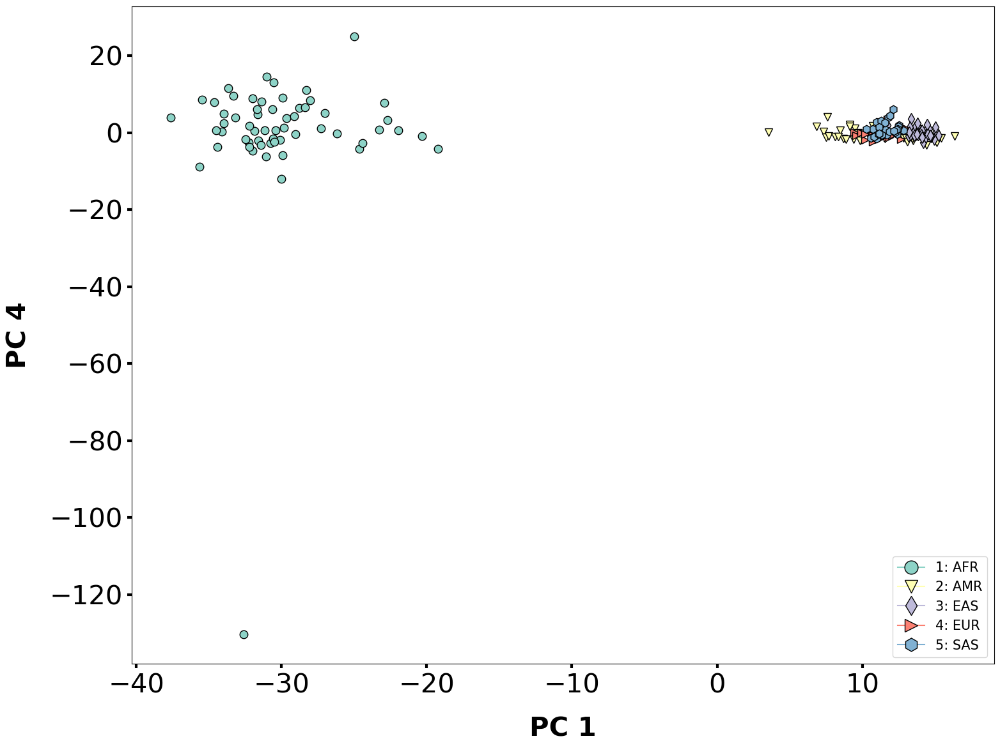

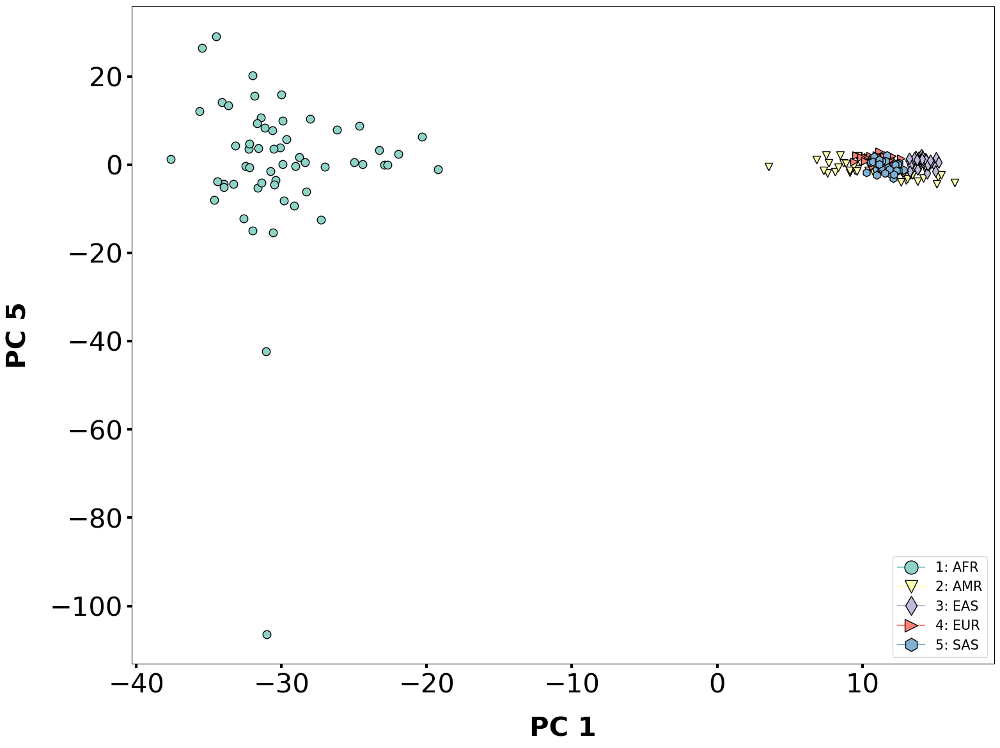

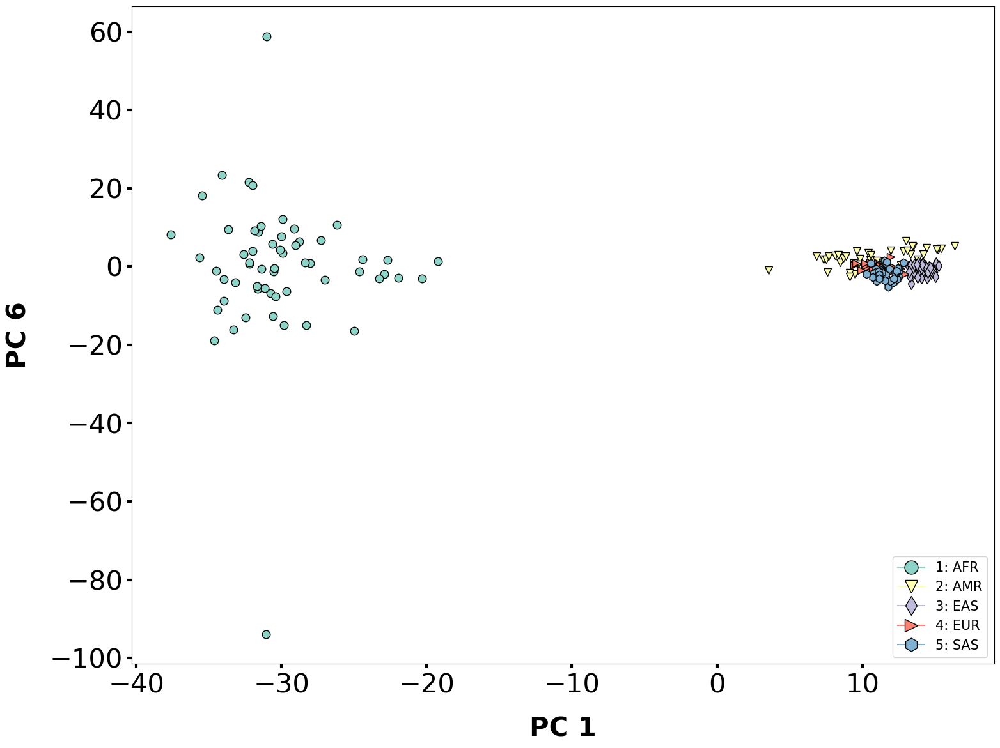

...

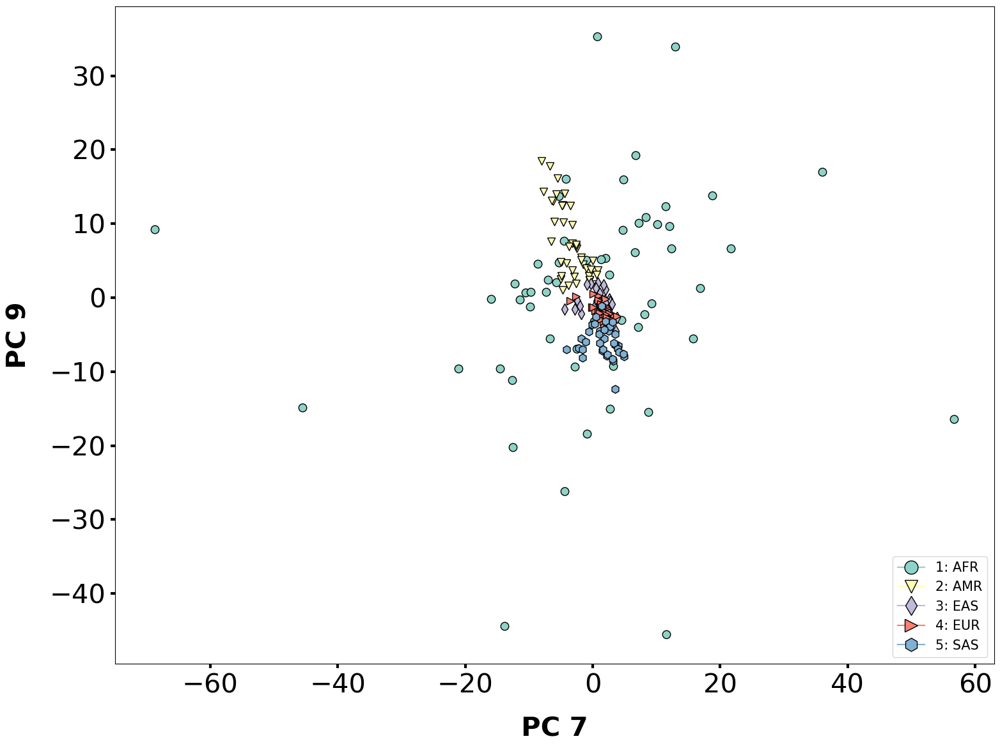

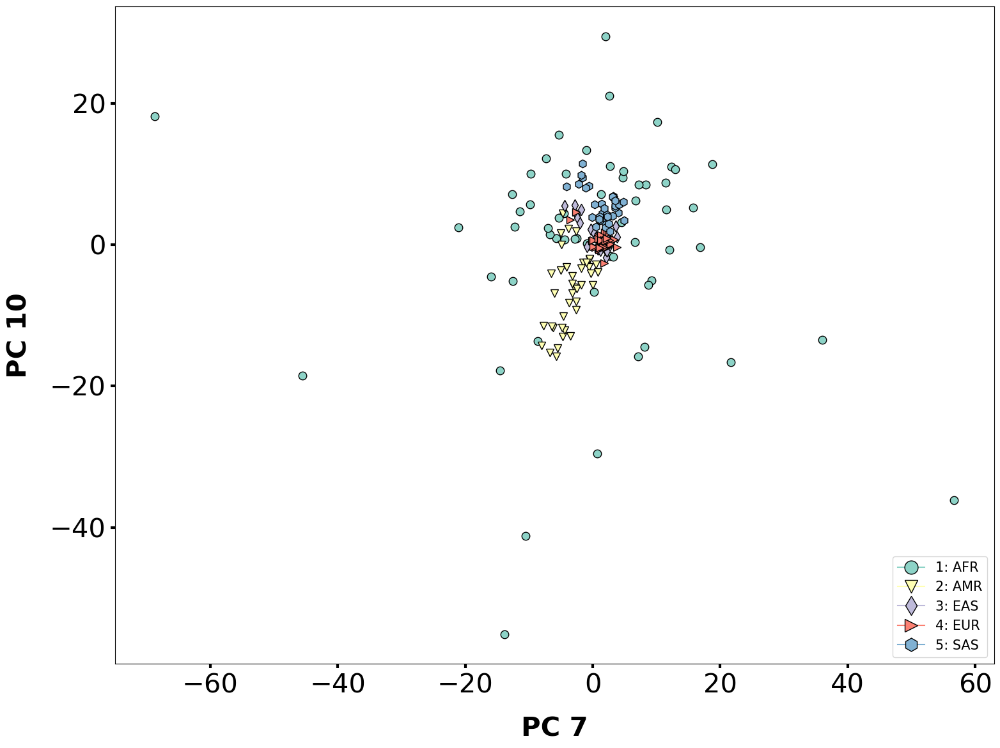

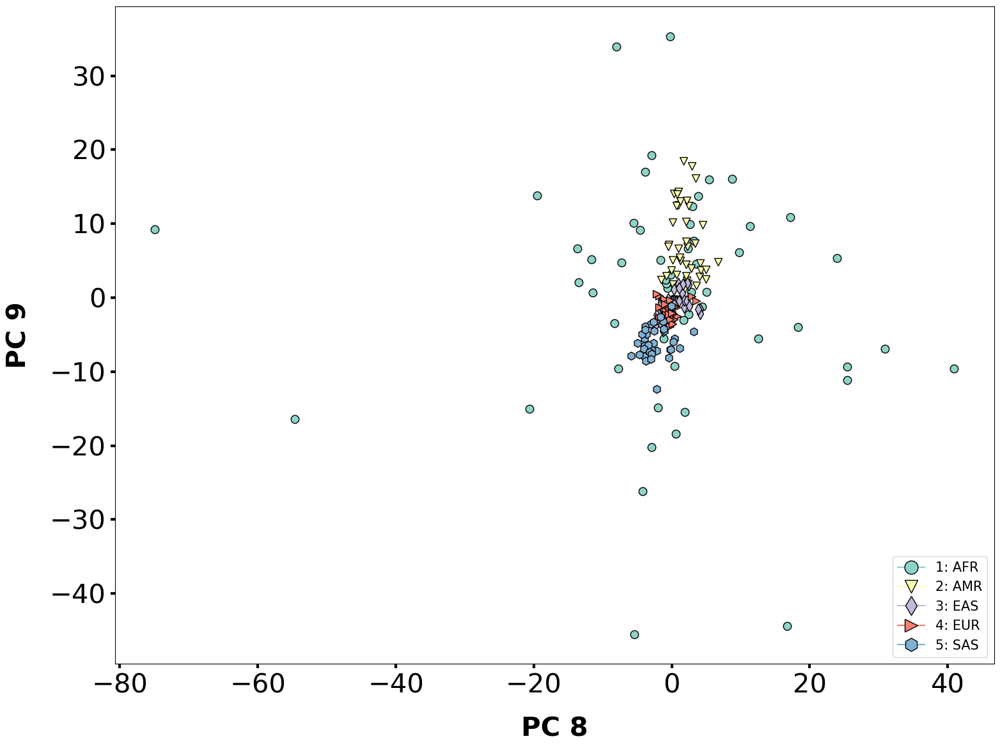

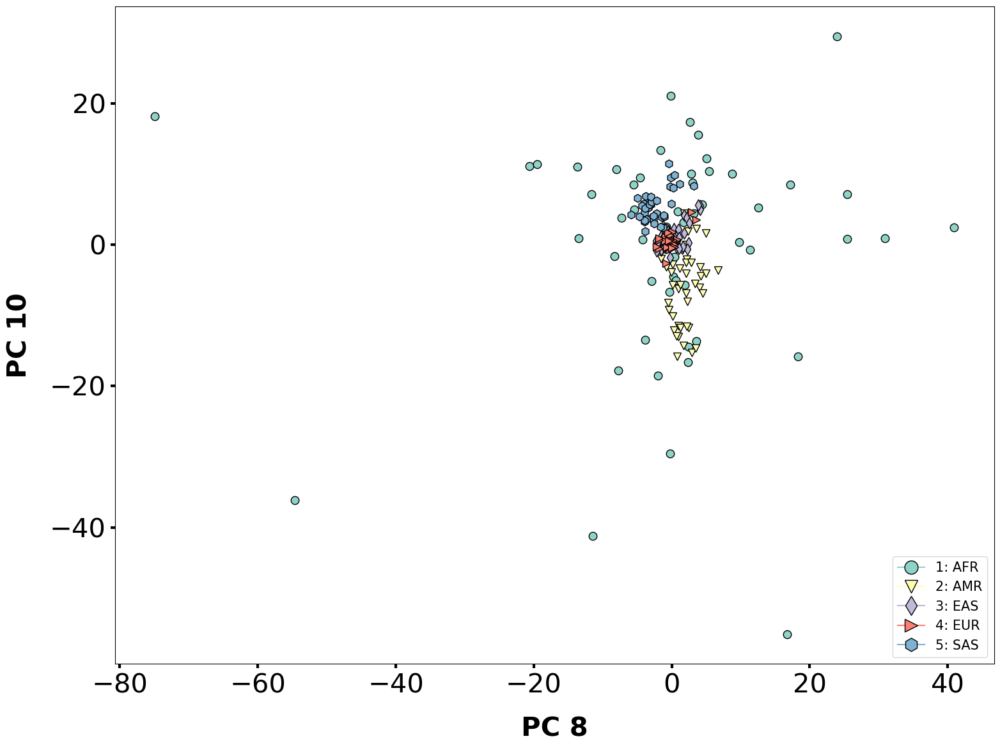

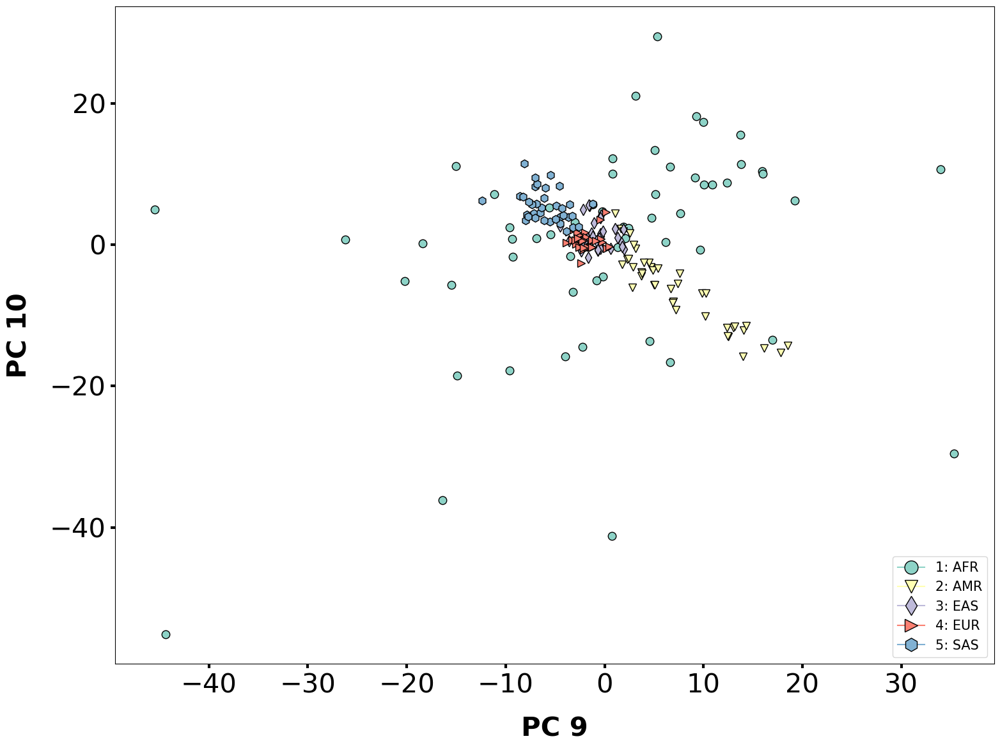

In [196]:
components = [1,2,3,4,5,6,7,8,9,10]

combinations_components = list(combinations(components,2))
for i in combinations_components:
    plot_scatter_cluster_shape(data=df_pca, abscissa='component_'+str(i[0]), ordinate='component_'+str(i[1]), label_horizontal='PC '+ str(i[0]), label_vertical='PC '+str(i[1]), factor='Region', fonts=define_font_properties(), colors=define_color_properties(), legend=True)
    #print(str(i[0]))

        component_1  component_2  component_3  component_4  component_5  \
Region                                                                    
EUR       16.049511    35.389102    -9.432584     9.260597    11.238226   
EUR        4.100435    25.132607    35.625358     7.144080    12.332677   
EUR       14.397149    37.727411   -11.430264     6.749049    15.915318   
EUR       13.986888    39.166210   -12.144688     6.386001    14.853464   
EUR       14.060099    34.344454   -10.500830     5.394533    14.436042   
...             ...          ...          ...          ...          ...   
SAS       15.260074    12.302468    -4.710922    17.455920   -22.360182   
SAS       18.540015    13.796132    -4.088610    13.838880   -25.220964   
SAS       18.148634    12.795469    -5.596722    13.934431   -25.828398   
SAS       17.797764    13.216937    -3.511182    14.531791   -24.229600   
SAS       19.295672     9.727892    -3.748199    15.470655   -28.676932   

        component_6  com

/var/folders/05/4pfxtbrs5459ytz3j1jhcgt00000gn/T/ipykernel_3856/2124056540.py:115: FutureWarning: Creating a Groupby object with a length-1 list-like level parameter will yield indexes as tuples in a future version. To keep indexes as scalars, create Groupby objects with a scalar level parameter instead.
  for name, group in groups:
/var/folders/05/4pfxtbrs5459ytz3j1jhcgt00000gn/T/ipykernel_3856/2124056540.py:132: FutureWarning: Creating a Groupby object with a length-1 list-like level parameter will yield indexes as tuples in a future version. To keep indexes as scalars, create Groupby objects with a scalar level parameter instead.
  for name, group in groups:


array([0.12762838, 0.05712145, 0.02781996, 0.02299774, 0.01416142,
       0.00708676, 0.00653948, 0.00553403, 0.00530784, 0.00526187])

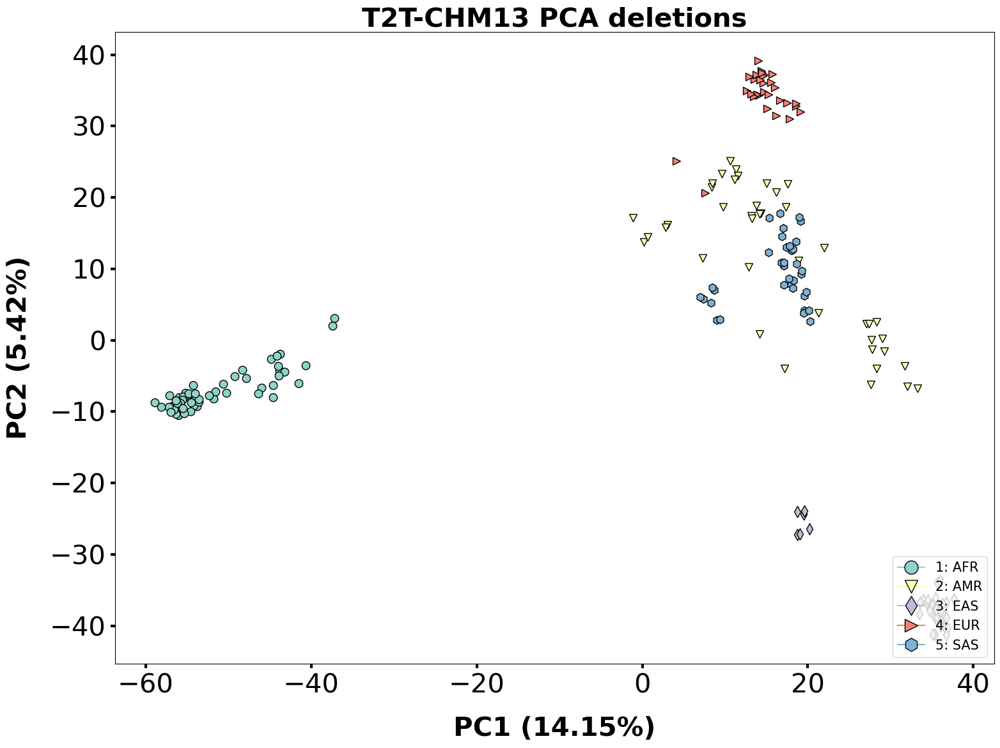

In [166]:
plot_scatter_cluster_shape(data=df_pca, abscissa='component_1', ordinate='component_2', label_horizontal='PC1 (14.15%)', label_vertical='PC2 (5.42%)', factor='Region', fonts=define_font_properties(), colors=define_color_properties(), legend=True)
plt.title("T2T-CHM13 PCA deletions", size=30, fontweight="bold")
pca.explained_variance_ratio_
#plt.savefig('../plots/t2t_chm13_pca_deletions_pc12_cnvr.png', transparent=True)

In [171]:
def plot_scatter_cluster_shape(
data=None,
abscissa=None,
ordinate=None,
label_horizontal=None,
label_vertical=None,
factor=None,
fonts=None,
colors=None,
#legend=None,
):
    """
    Creates a figure of a chart of type histogram to represent the frequency
    distribution of a single series of values.
    arguments:
        data (object): Pandas data frame of groups, series, and values
        abscissa (str): name of data column with independent variable
        ordinate (str): name of data column with dependent variable
        label_horizontal (str): label for horizontal axis
        label_vertical (str): label for vertical axis
        factor (str): name of data column with groups or factors of samples
        fonts (dict<object>): references to definitions of font properties
        colors (dict<tuple>): references to definitions of color properties
        legend (bool): whether to include a legend for series on the chart
    raises:
    returns:
        (object): figure object
    """
##########
# Organize data.
# Separate points by groups.
# Define groups.
    
    import matplotlib
    data = data.copy(deep=True)   
    data.set_index(
        factor,
append=False,
drop=True,
inplace=True
    )
    print(data)
    groups = data.groupby(level=[factor])
    print("Count of groups by factor: " + str(len(groups)))
    import seaborn
    colors_series = list(seaborn.color_palette("Set3", n_colors=len(groups)))
    shape_series = list(['o','v','d','>','h','<','s'])
##########
# Create figure.
    figure = matplotlib.pyplot.figure(
    figsize=(15.748, 11.811),
    tight_layout=True
    )
# Create axes.
    axes = matplotlib.pyplot.axes()
    axes.set_xlabel(
    xlabel=label_horizontal,
labelpad=20,
alpha=1.0,
backgroundcolor=colors["white"],
color=colors["black"],
fontproperties=fonts["properties"]["one"]
    )
    axes.set_ylabel(
        ylabel=label_vertical,
        labelpad=20,
        alpha=1.0,
        backgroundcolor=colors["white"],
        color=colors["black"],
        fontproperties=fonts["properties"]["one"]
    )
    axes.tick_params(
        axis="both",
        which="both",
        direction="out",
        length=5.0,
        width=3.0,
        color=colors["black"],
        pad=5,
        labelsize=fonts["values"]["one"]["size"],
        labelcolor=colors["black"]
    )
# Plot points for values from each group.
    index = 0
    for name, group in groups:
        values_x = group[abscissa].to_list()
        values_y = group[ordinate].to_list()
        handle = axes.plot(
            values_x,
            values_y,
linestyle="",
marker= shape_series[index],
markersize=9, 
markeredgecolor=colors["black"],
markerfacecolor=colors_series[index] # colors["black"]
        )
        index += 1
        pass
# Plot labels for each group.
    labels = []
    index = 0
    for name, group in groups:
        values_x = group[abscissa].to_list()
        mean_x = statistics.median(values_x)
        values_y = group[ordinate].to_list()
        mean_y = statistics.median(values_y)
#        axes.text(
#            mean_x,
#            mean_y,
#str(index+1),
#backgroundcolor=colors["white_faint"],
#color=colors["black"],
#fontproperties=fonts["properties"]["three"],
#horizontalalignment="center",
#verticalalignment="center"
#        )
        label = str(index+1) + ": " + name
        labels.append(label)
        index += 1
        pass
# Create legend.
# Create custome elements for the legend

    return figure


#plot_scatter_cluster_shape(data=df_pca, abscissa='component_1', ordinate='component_2', label_horizontal='PC1', label_vertical='PC2', factor='Region', fonts=define_font_properties(), colors=define_color_properties())


#plt.savefig('../plots/t2t_chm13_pca_deletions_pc12_cnvr_poster.png', transparent=True)

In [100]:
plot_scatter_cluster_shape(data=df_pca, abscissa='component_3', ordinate='component_4', label_horizontal='PC3 (2.92%)', label_vertical='PC4 (2.11%)', factor='Region', fonts=define_font_properties(), colors=define_color_properties(), legend=True)
plt.title("T2T-CHM13 PCA deletions ")

plt.savefig('../plots/t2t_chm13_pca_deletions_pc34_cnvr.png', transparent=True)

TypeError: plot_scatter_cluster_shape() got an unexpected keyword argument 'legend'

<h1> Duplications

In [167]:
cnv_passed_vst = cnvs.T.iloc[filtering_vst.T.index]

cnv_passed_vst = cnv_passed_vst[(cnv_passed_vst[cnv_passed_vst.columns[1:]]>1).all(axis=1)]
#cnv_passed_vst = cnv_passed_vst[(cnv_passed_vst[cnv_passed_vst.columns[1:]]<5).all(axis=1)]
cnv_passed_vst = cnv_passed_vst.T
counts = cnv_passed_vst
counts = counts.sort_index()
counts 

,21685,24167,30120,31571,38369,41691,62434,75845,90658,91976,...,330337,332239,355423,356793,357803,369977,372201,372321,373547,373771
Sample_ID,,,,,,,,,,,,,,,,,,,,,
HG00097,2.0,2.0,6.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,2.0,2.0,4.0,3.0,2.0,2.0,2.0,2.0,2.0,2.0
HG00099,2.0,2.0,4.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,3.0,2.0,2.0,3.0,2.0,3.0,2.0,2.0,2.0,2.0
HG00126,2.0,2.0,6.0,2.0,2.0,2.0,3.0,2.0,2.0,2.0,...,3.0,2.0,2.0,2.0,2.0,2.0,2.0,3.0,2.0,2.0
HG00128,3.0,2.0,3.0,2.0,2.0,4.0,2.0,2.0,2.0,3.0,...,4.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,4.0,2.0
HG00133,2.0,2.0,5.0,3.0,2.0,2.0,2.0,2.0,2.0,2.0,...,3.0,2.0,2.0,2.0,2.0,2.0,2.0,3.0,2.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
NA21093,3.0,2.0,3.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,4.0,2.0,2.0,2.0,2.0,4.0,2.0,3.0,2.0,4.0
NA21102,2.0,2.0,3.0,2.0,2.0,2.0,3.0,3.0,2.0,3.0,...,2.0,2.0,4.0,2.0,2.0,4.0,3.0,3.0,4.0,3.0
NA21106,3.0,2.0,2.0,2.0,2.0,3.0,2.0,2.0,2.0,3.0,...,6.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,2.0,2.0


In [168]:
cnv_passed_vst = cnvs.T.iloc[filtering_vst.T.index]
cnv_passed_vst = cnv_passed_vst[(cnv_passed_vst[cnv_passed_vst.columns[1:]]>1).all(axis=1)]
#cnv_passed_vst = cnv_passed_vst[(cnv_passed_vst[cnv_passed_vst.columns[1:]]<5).all(axis=1)]
counts = cnv_passed_vst.T
counts = counts.sort_index()
counts

,21685,24167,30120,31571,38369,41691,62434,75845,90658,91976,...,330337,332239,355423,356793,357803,369977,372201,372321,373547,373771
Sample_ID,,,,,,,,,,,,,,,,,,,,,
HG00097,2.0,2.0,6.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,2.0,2.0,4.0,3.0,2.0,2.0,2.0,2.0,2.0,2.0
HG00099,2.0,2.0,4.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,3.0,2.0,2.0,3.0,2.0,3.0,2.0,2.0,2.0,2.0
HG00126,2.0,2.0,6.0,2.0,2.0,2.0,3.0,2.0,2.0,2.0,...,3.0,2.0,2.0,2.0,2.0,2.0,2.0,3.0,2.0,2.0
HG00128,3.0,2.0,3.0,2.0,2.0,4.0,2.0,2.0,2.0,3.0,...,4.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,4.0,2.0
HG00133,2.0,2.0,5.0,3.0,2.0,2.0,2.0,2.0,2.0,2.0,...,3.0,2.0,2.0,2.0,2.0,2.0,2.0,3.0,2.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
NA21093,3.0,2.0,3.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,...,4.0,2.0,2.0,2.0,2.0,4.0,2.0,3.0,2.0,4.0
NA21102,2.0,2.0,3.0,2.0,2.0,2.0,3.0,3.0,2.0,3.0,...,2.0,2.0,4.0,2.0,2.0,4.0,3.0,3.0,4.0,3.0
NA21106,3.0,2.0,2.0,2.0,2.0,3.0,2.0,2.0,2.0,3.0,...,6.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,2.0,2.0


In [169]:
#PCA

x = StandardScaler().fit_transform(counts)
pca = PCA(n_components=10)
pca_results = pca.fit_transform(x)

df_pca= pd.DataFrame(pca_results,
                          columns=['component_1','component_2', 'component_3', 'component_4',
                                  'component_5',
                                  'component_6',
                                  'component_7',
                                  'component_8',
                                  'component_9',
                                   'component_10'
                                  ],
                          index=features.index)




df_pca = features.merge(df_pca, left_index=True, right_index=True)
pca.explained_variance_ratio_

array([0.10675448, 0.0610907 , 0.03892178, 0.03322453, 0.03009814,
       0.02905153, 0.02725646, 0.0261997 , 0.02549744, 0.02421062])

        component_1  component_2  component_3  component_4  component_5  \
Region                                                                    
EUR       -0.240651    -4.232856     1.869409    -0.402565     1.579766   
EUR        0.960914    -2.200972    -1.394929    -1.165177    -0.076592   
EUR       -0.632871    -1.057683     1.692771    -2.906466    -1.689374   
EUR       -0.594350    -2.709039     3.953369    -1.220712     0.197588   
EUR        1.131487    -2.258718     1.017861    -1.289584    -1.290128   
...             ...          ...          ...          ...          ...   
SAS       -0.369319    -1.009515     1.600005     1.251631    -3.207001   
SAS       -2.144052    -2.731283     2.158143     3.854127    -0.842164   
SAS        0.179179     0.500798     2.353688     0.859774    -0.356866   
SAS       -0.684589     0.080152    -0.218725     1.750307     0.124246   
SAS       -1.841181    -2.671012     0.065013     0.731628    -0.459126   

        component_6  com

/var/folders/05/4pfxtbrs5459ytz3j1jhcgt00000gn/T/ipykernel_3856/2124056540.py:115: FutureWarning: Creating a Groupby object with a length-1 list-like level parameter will yield indexes as tuples in a future version. To keep indexes as scalars, create Groupby objects with a scalar level parameter instead.
  for name, group in groups:
/var/folders/05/4pfxtbrs5459ytz3j1jhcgt00000gn/T/ipykernel_3856/2124056540.py:132: FutureWarning: Creating a Groupby object with a length-1 list-like level parameter will yield indexes as tuples in a future version. To keep indexes as scalars, create Groupby objects with a scalar level parameter instead.
  for name, group in groups:


Text(0.5, 1.0, 'T2T-CHM13 PCA duplications')

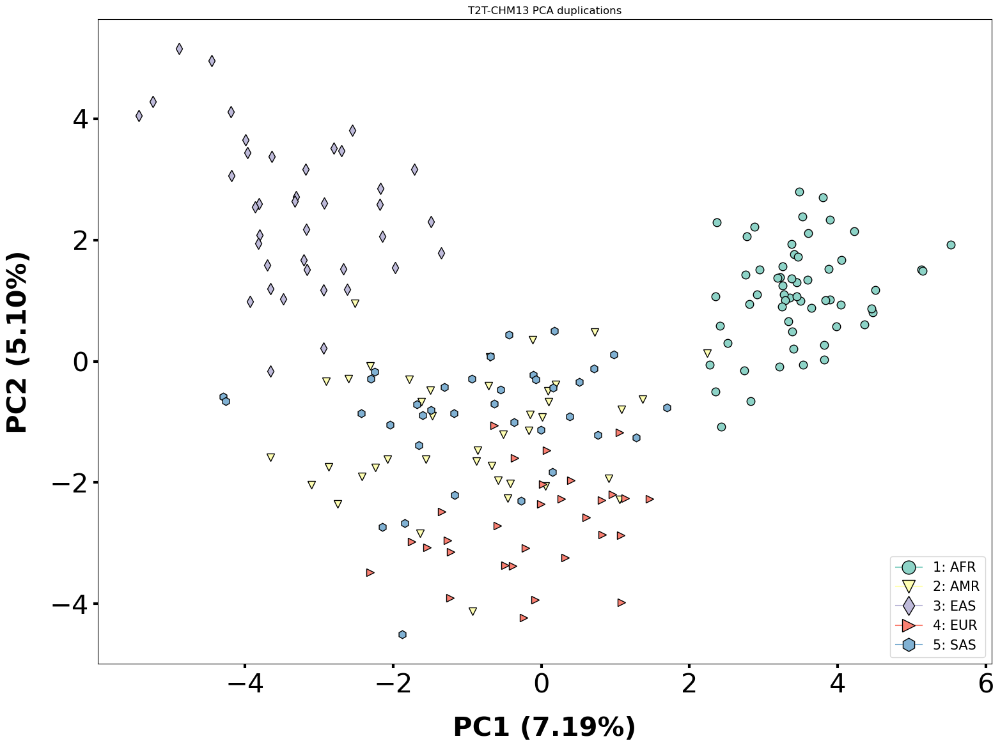

In [170]:
plot_scatter_cluster_shape(data=df_pca, abscissa='component_1', ordinate='component_2', label_horizontal='PC1 (7.19%)', label_vertical='PC2 (5.10%)', factor='Region', fonts=define_font_properties(), colors=define_color_properties())
plt.title("T2T-CHM13 PCA duplications")

#plt.savefig('../plots/t2t_chm13_pca_duplications_pc12_cnvr.png', transparent=True)

        component_1  component_2  component_3  component_4  component_5  \
Region                                                                    
EUR        0.311169    -4.187050     1.831533    -0.473104     0.651342   
EUR       -0.750798    -2.332793    -1.433600     0.422023     1.432720   
EUR        0.782437    -1.182958     1.075832     3.215423    -0.907039   
EUR        0.643889    -2.688747     3.331639     1.424991    -0.361356   
EUR       -1.151206    -2.324047     0.742038     1.197506     0.277085   
...             ...          ...          ...          ...          ...   
SAS       -0.013661    -0.674517     1.358154     1.180680     2.629452   
SAS        1.233981    -2.703246     2.743191    -1.981243    -1.998222   
SAS        0.253142     0.228763     2.680597    -0.621348     2.360520   
SAS        0.479411     0.273594     0.257740    -0.070496    -1.315581   
SAS        1.767677    -2.899677     0.027477    -1.173139     0.471869   

        component_6  com

/var/folders/05/4pfxtbrs5459ytz3j1jhcgt00000gn/T/ipykernel_3856/2124056540.py:115: FutureWarning: Creating a Groupby object with a length-1 list-like level parameter will yield indexes as tuples in a future version. To keep indexes as scalars, create Groupby objects with a scalar level parameter instead.
  for name, group in groups:
/var/folders/05/4pfxtbrs5459ytz3j1jhcgt00000gn/T/ipykernel_3856/2124056540.py:132: FutureWarning: Creating a Groupby object with a length-1 list-like level parameter will yield indexes as tuples in a future version. To keep indexes as scalars, create Groupby objects with a scalar level parameter instead.
  for name, group in groups:


Text(0.5, 1.0, 'T2T-CHM13 PCA duplications')

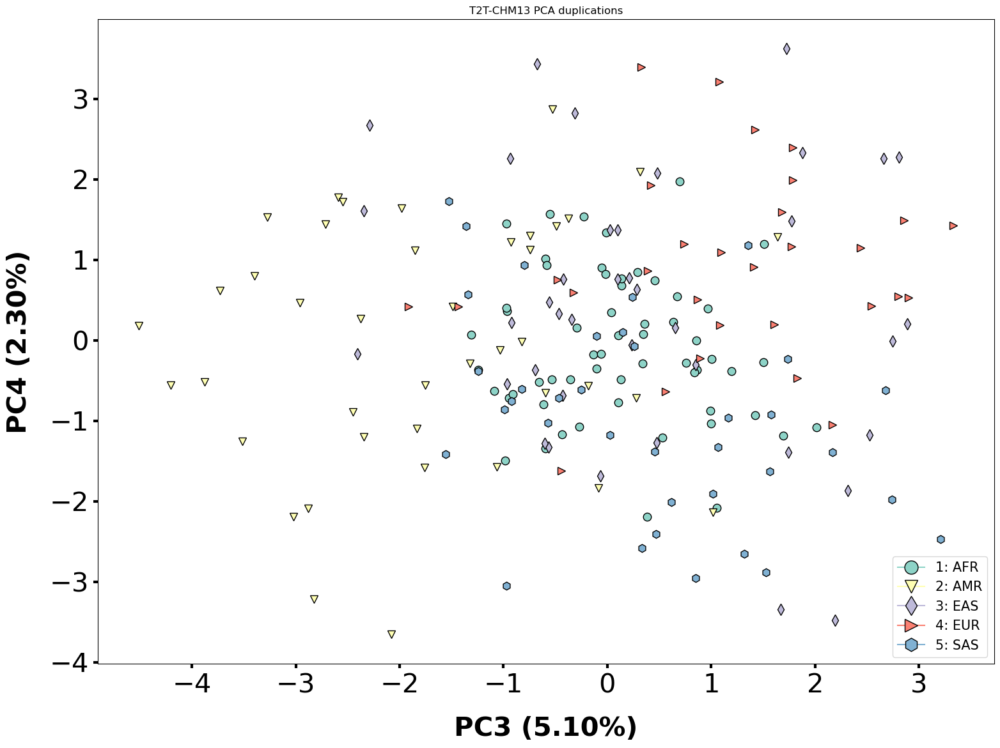

In [90]:
plot_scatter_cluster_shape(data=df_pca, abscissa='component_3', ordinate='component_4', label_horizontal='PC3 (5.10%)', label_vertical='PC4 (2.30%)', factor='Region', fonts=define_font_properties(), colors=define_color_properties(), legend=True)
plt.title("T2T-CHM13 PCA duplications")

#plt.savefig('../plots/t2t_chm13_pca_duplications_pc34_cnvr.png', transparent=True)

        component_1  component_2  component_3  component_4  component_5  \
Region                                                                    
EUR        0.311169    -4.187050     1.831533    -0.473104     0.651342   
EUR       -0.750798    -2.332793    -1.433600     0.422023     1.432720   
EUR        0.782437    -1.182958     1.075832     3.215423    -0.907039   
EUR        0.643889    -2.688747     3.331639     1.424991    -0.361356   
EUR       -1.151206    -2.324047     0.742038     1.197506     0.277085   
...             ...          ...          ...          ...          ...   
SAS       -0.013661    -0.674517     1.358154     1.180680     2.629452   
SAS        1.233981    -2.703246     2.743191    -1.981243    -1.998222   
SAS        0.253142     0.228763     2.680597    -0.621348     2.360520   
SAS        0.479411     0.273594     0.257740    -0.070496    -1.315581   
SAS        1.767677    -2.899677     0.027477    -1.173139     0.471869   

        component_6  com

/Users/luciabazan/Documents/GitHub/cnv_sgdp/backup/scripts_backup/pca_plot.py:85: FutureWarning: Creating a Groupby object with a length-1 list-like level parameter will yield indexes as tuples in a future version. To keep indexes as scalars, create Groupby objects with a scalar level parameter instead.
  for name, group in groups:
/Users/luciabazan/Documents/GitHub/cnv_sgdp/backup/scripts_backup/pca_plot.py:102: FutureWarning: Creating a Groupby object with a length-1 list-like level parameter will yield indexes as tuples in a future version. To keep indexes as scalars, create Groupby objects with a scalar level parameter instead.
  for name, group in groups:
/Users/luciabazan/Documents/GitHub/cnv_sgdp/backup/scripts_backup/pca_plot.py:85: FutureWarning: Creating a Groupby object with a length-1 list-like level parameter will yield indexes as tuples in a future version. To keep indexes as scalars, create Groupby objects with a scalar level parameter instead.
  for name, group in group

        component_1  component_2  component_3  component_4  component_5  \
Region                                                                    
EUR        0.311169    -4.187050     1.831533    -0.473104     0.651342   
EUR       -0.750798    -2.332793    -1.433600     0.422023     1.432720   
EUR        0.782437    -1.182958     1.075832     3.215423    -0.907039   
EUR        0.643889    -2.688747     3.331639     1.424991    -0.361356   
EUR       -1.151206    -2.324047     0.742038     1.197506     0.277085   
...             ...          ...          ...          ...          ...   
SAS       -0.013661    -0.674517     1.358154     1.180680     2.629452   
SAS        1.233981    -2.703246     2.743191    -1.981243    -1.998222   
SAS        0.253142     0.228763     2.680597    -0.621348     2.360520   
SAS        0.479411     0.273594     0.257740    -0.070496    -1.315581   
SAS        1.767677    -2.899677     0.027477    -1.173139     0.471869   

        component_6  com

/Users/luciabazan/Documents/GitHub/cnv_sgdp/backup/scripts_backup/pca_plot.py:85: FutureWarning: Creating a Groupby object with a length-1 list-like level parameter will yield indexes as tuples in a future version. To keep indexes as scalars, create Groupby objects with a scalar level parameter instead.
  for name, group in groups:
/Users/luciabazan/Documents/GitHub/cnv_sgdp/backup/scripts_backup/pca_plot.py:102: FutureWarning: Creating a Groupby object with a length-1 list-like level parameter will yield indexes as tuples in a future version. To keep indexes as scalars, create Groupby objects with a scalar level parameter instead.
  for name, group in groups:
/Users/luciabazan/Documents/GitHub/cnv_sgdp/backup/scripts_backup/pca_plot.py:50: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.

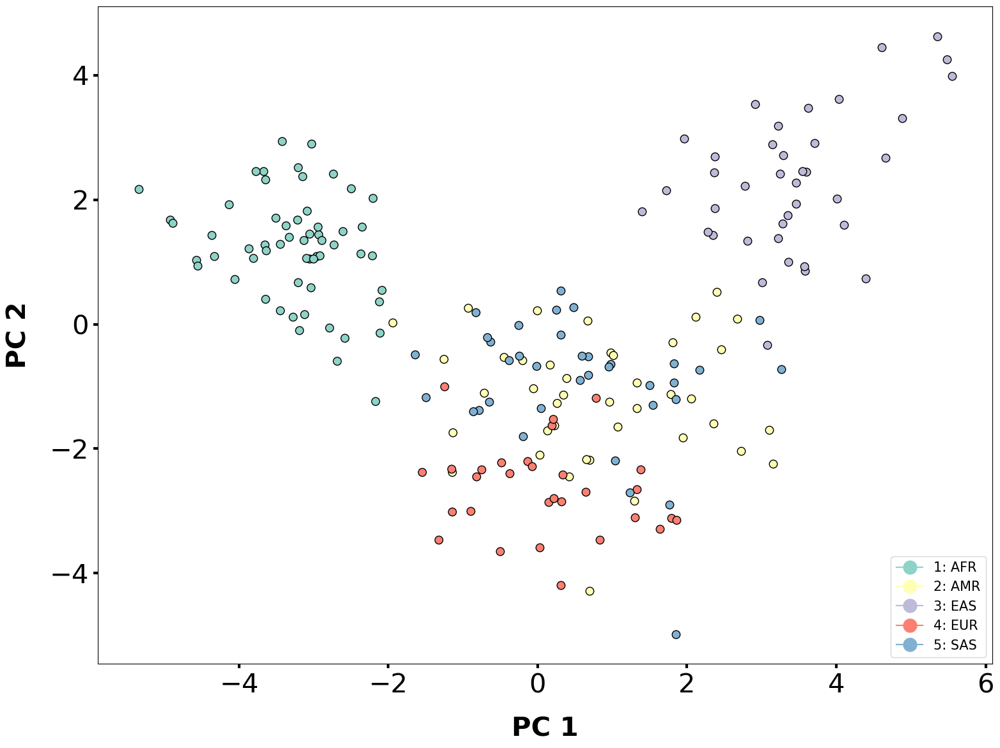

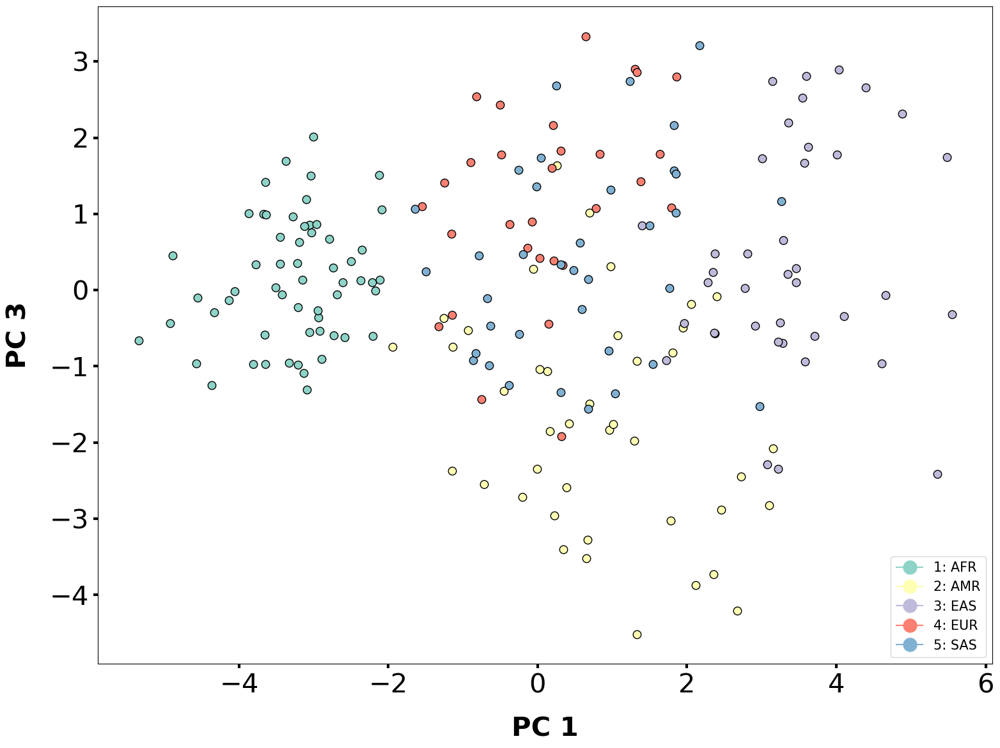

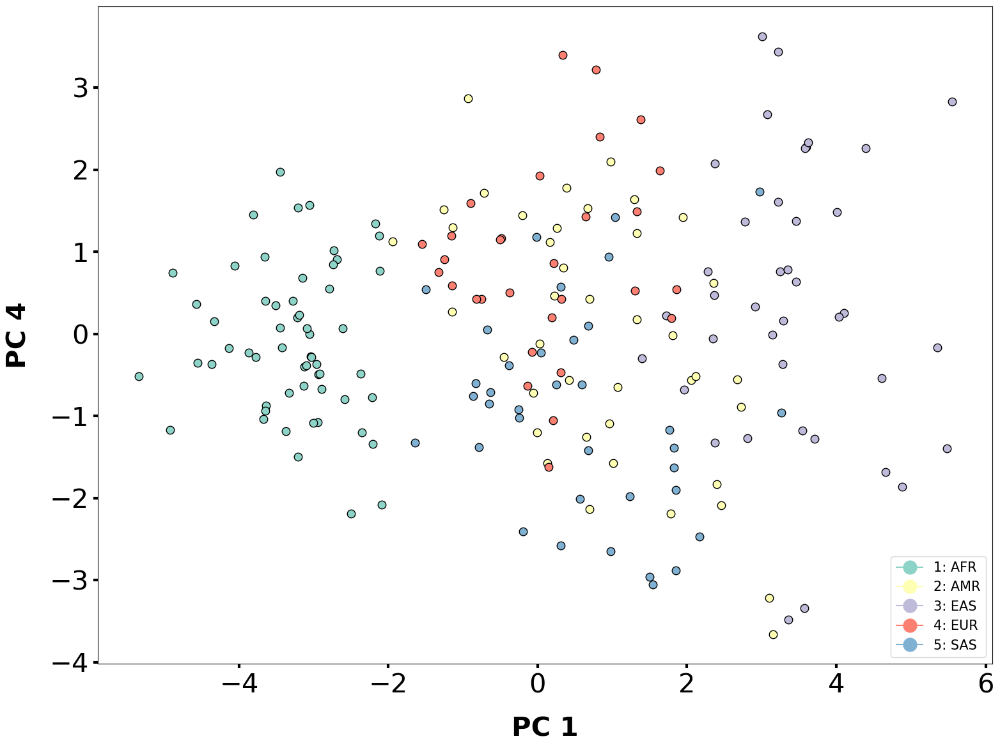

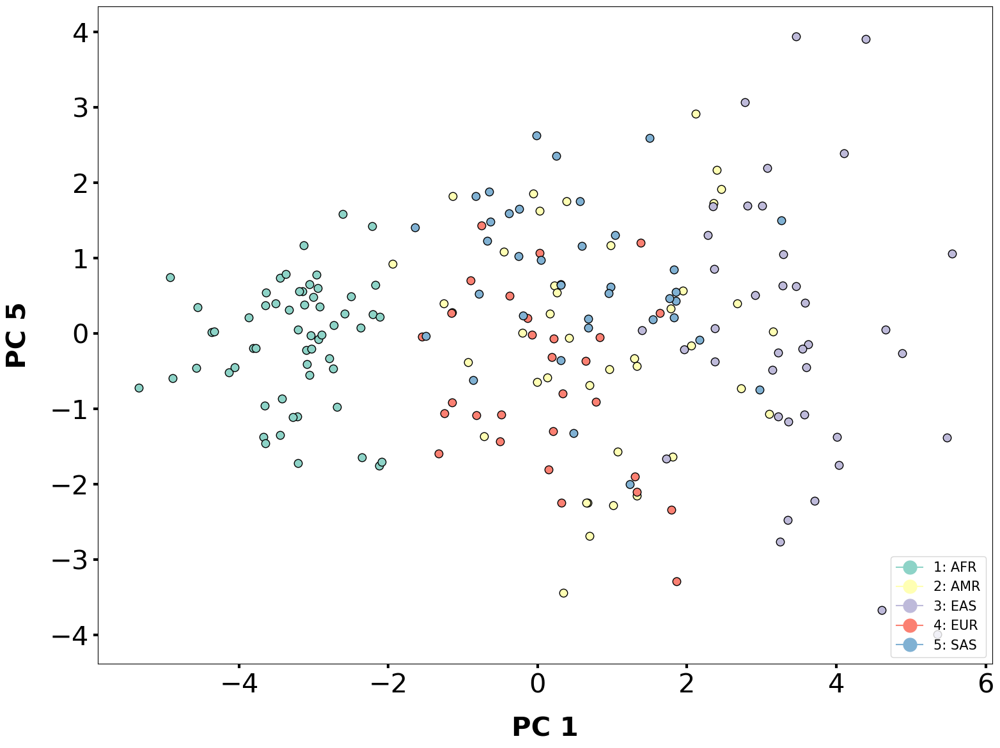

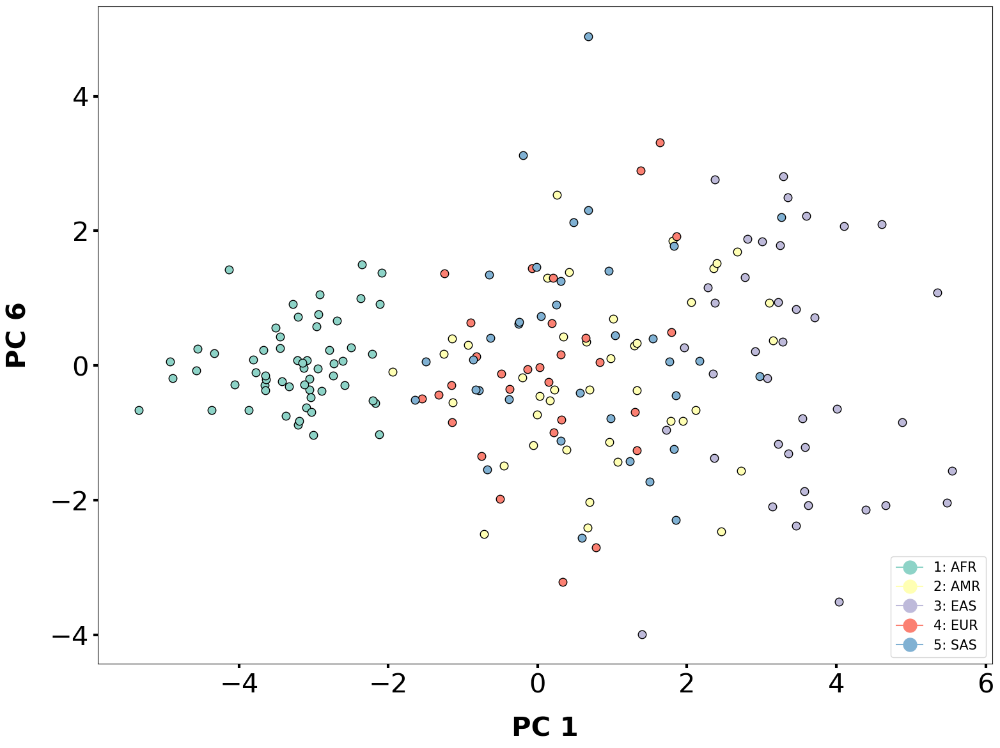

...

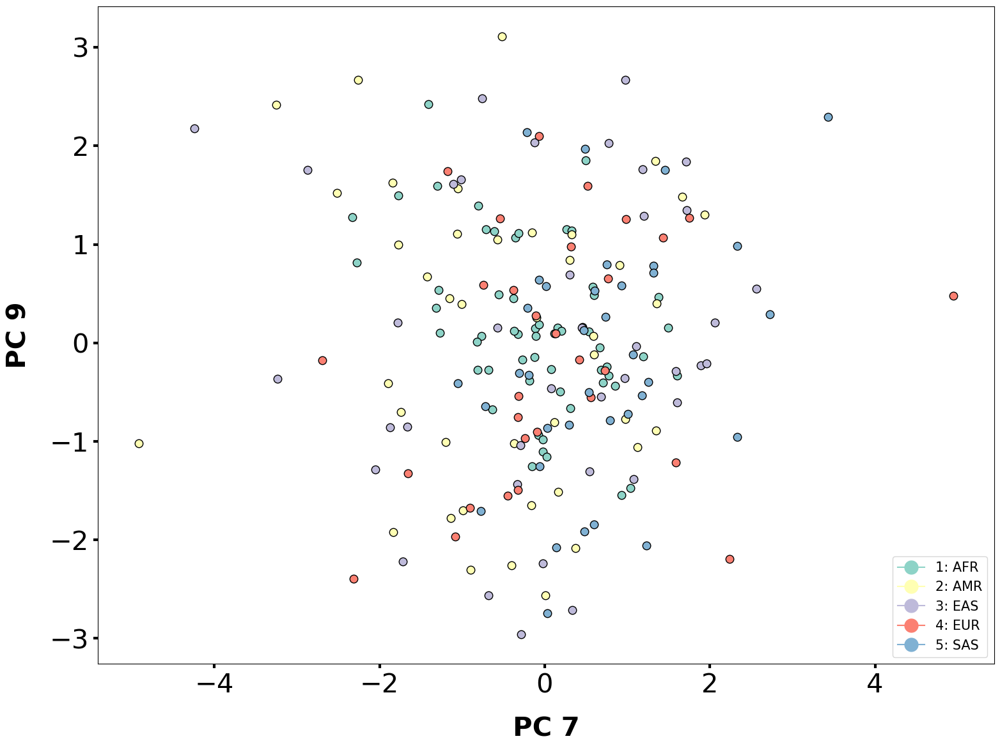

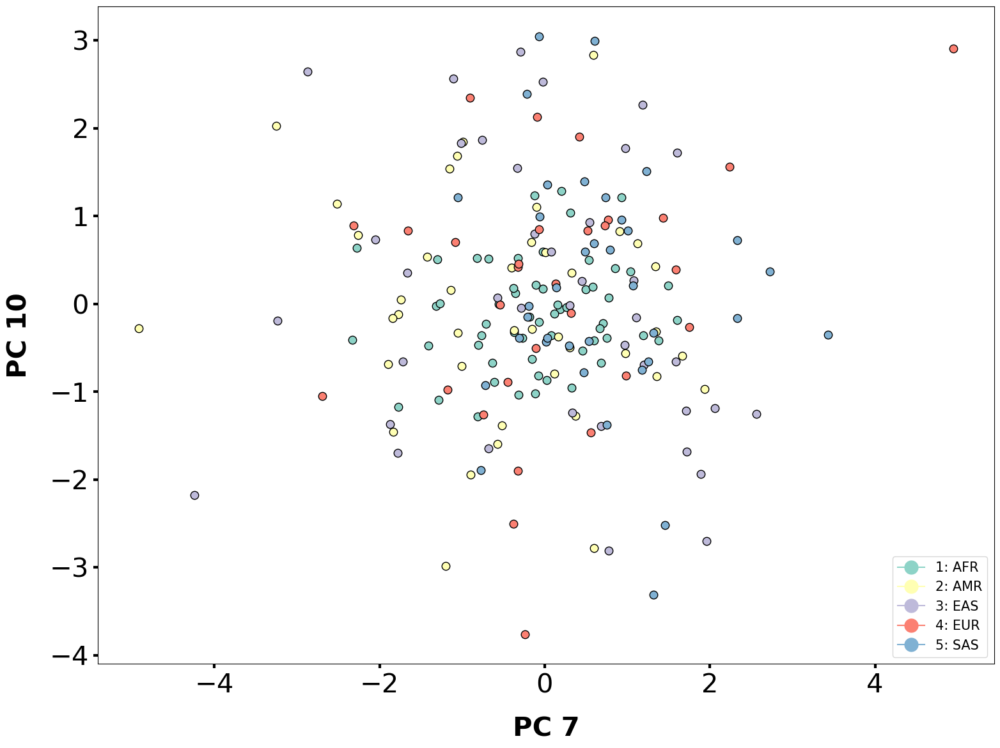

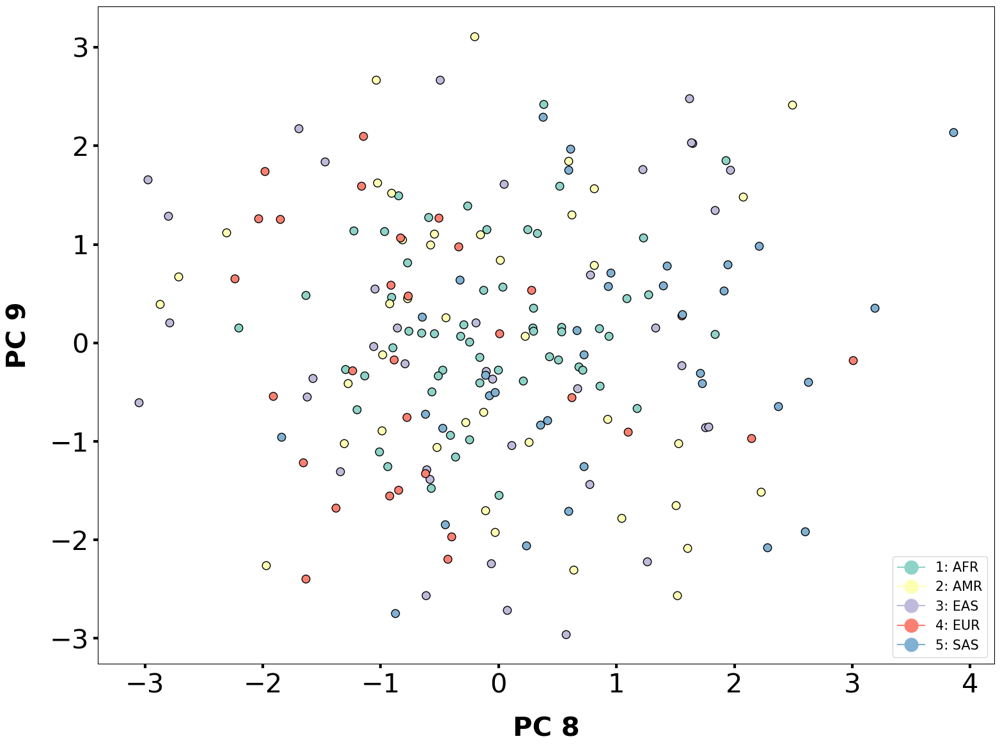

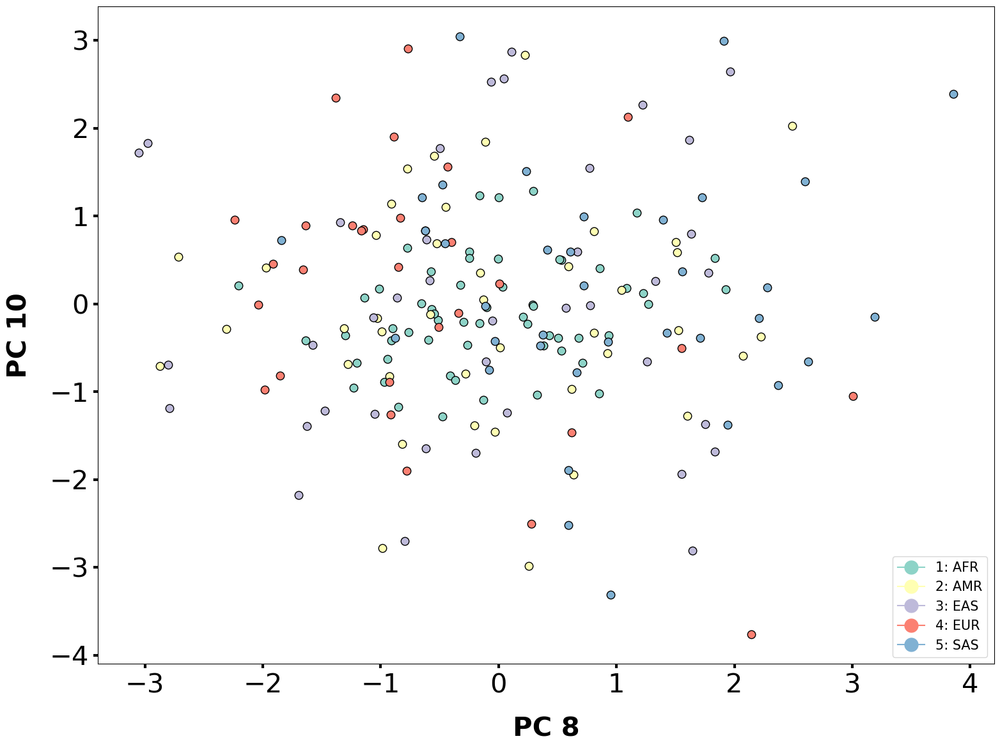

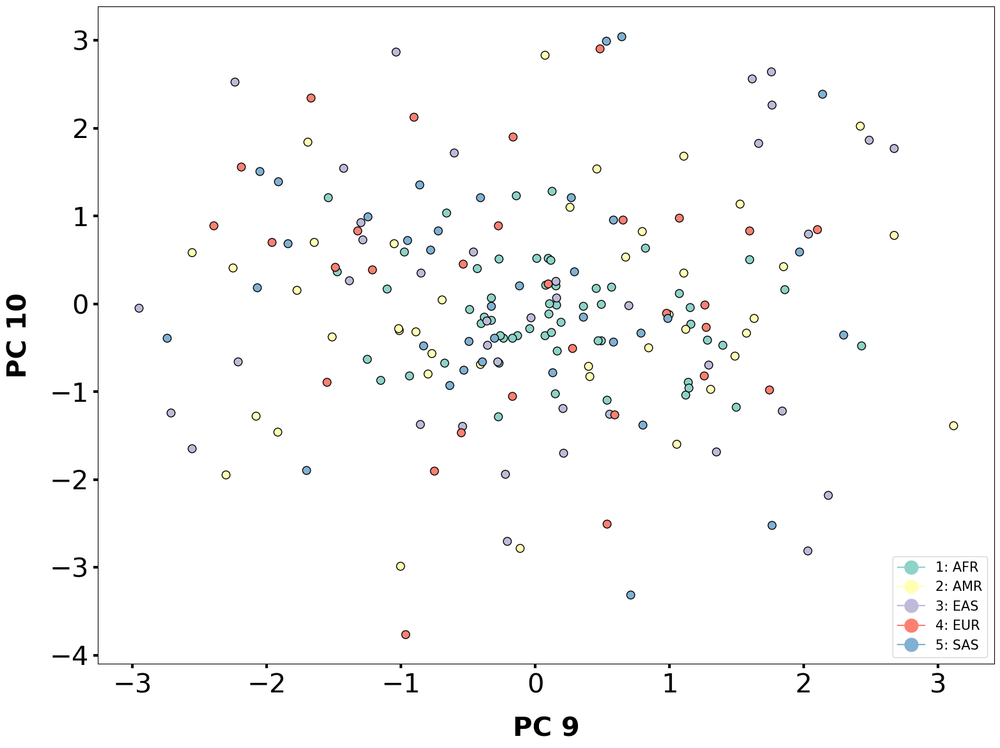

In [91]:
components = [1,2,3,4,5,6,7,8,9,10]

combinations_components = list(combinations(components,2))
for i in combinations_components:
    plot_scatter_cluster(data=df_pca, abscissa='component_'+str(i[0]), ordinate='component_'+str(i[1]), label_horizontal='PC '+ str(i[0]), label_vertical='PC '+str(i[1]), factor='Region', fonts=define_font_properties(), colors=define_color_properties())
    #print(str(i[0]))

In [110]:
vst_dt_filtered_duplications = vst_dt.iloc[cnv_passed_vst.index]
vst_dt_filtered_duplications.sort_values(by=['Oceania-WestEurasia'], ascending=False).head(50)

ValueError: invalid literal for int() with base 10: 'LP6005441-DNA_A04'

<h1> Permutation

In [102]:
print("Starting permutation")
### Grouping again 
cnvs_passed_vst = cnvs.T.iloc[filtering_vst.T.index]
cnvs_passed_vst = cnvs_passed_vst.T

dt_cnvs_passed_vst = features.merge(cnvs_passed_vst, left_index=True, right_index=True)
dt_cnvs_passed_vst.head()


Starting permutation


,Region,2859,2973,3181,3260,3269,3287,3338,3342,3378,...,172241,172242,172248,172257,172260,172262,172294,172298,172409,172609
Sample,,,,,,,,,,,,,,,,,,,,,
LP6005441-DNA_A03,Oceania,2.0,2.0,2.0,2.000000,1.0,2.0,2.0,2.0,1.0,...,2.0,2.0,2.0,1.0,1.0,2.0,1.0,2.0,1.0,2.0
LP6005441-DNA_A04,America,2.0,35.0,2.0,9.500000,3.0,2.0,2.0,2.0,3.0,...,2.0,1.0,1.0,1.0,1.0,2.0,2.0,2.0,1.0,2.0
LP6005441-DNA_A05,WestEurasia,2.0,39.0,1.0,8.000000,3.0,2.0,2.0,2.0,3.0,...,1.0,1.0,2.0,1.0,2.0,2.0,2.0,2.0,2.0,2.0
LP6005441-DNA_A06,WestEurasia,2.0,40.0,1.0,10.500000,3.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,1.0,1.0,2.0,2.0,1.0,2.0,2.0
LP6005441-DNA_A08,Africa,2.0,35.0,2.0,6.333333,2.0,2.0,2.0,1.0,2.0,...,2.0,2.0,2.0,0.5,2.0,2.0,2.0,2.0,1.0,2.0


In [103]:
cnvs_passed_vst.columns

Index([  2859,   2973,   3181,   3260,   3269,   3287,   3338,   3342,   3378,
         3529,
       ...
       172241, 172242, 172248, 172257, 172260, 172262, 172294, 172298, 172409,
       172609],
      dtype='int64', length=1045)

In [104]:
####### Groupby regions #######
dt_group = dt_cnvs_passed_vst.groupby('Region')

dt_groupped = []
regions = features['Region'].unique()
for i in regions:
    dt_groupped.append(dt_group.get_group(str(i)))
    

#### Names to pair-population
regions = dt['Region'].unique()
combination_names = []
for i in list(combinations(regions,2)):
    combination_names.append(i[0]+str('-')+i[1])
    
dt_groupped[region[0]]

,Region,2859,2973,3181,3260,3269,3287,3338,3342,3378,...,172241,172242,172248,172257,172260,172262,172294,172298,172409,172609
Sample,,,,,,,,,,,,,,,,,,,,,
LP6005441-DNA_C03,SouthAsia,2.0,39.0,1.0,8.000000,3.000000,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,1.000000,1.0,2.0,2.0,1.0,1.0,2.0
LP6005441-DNA_C07,SouthAsia,2.0,36.0,2.0,7.666667,3.000000,2.0,2.0,2.0,3.0,...,2.0,2.0,2.0,0.666667,2.0,2.0,2.0,2.0,2.0,2.0
LP6005441-DNA_C10,SouthAsia,2.0,35.0,1.0,5.250000,3.000000,1.0,2.0,2.0,2.0,...,2.0,2.0,2.0,1.000000,1.0,2.0,2.0,2.0,2.0,2.0
LP6005441-DNA_D01,SouthAsia,2.0,35.0,2.0,7.333333,3.000000,3.0,2.0,1.0,3.0,...,2.0,2.0,1.0,1.000000,1.0,1.0,2.0,1.0,2.0,2.0
LP6005441-DNA_D03,SouthAsia,2.0,37.0,1.0,9.500000,3.000000,2.0,2.0,2.0,3.0,...,2.0,2.0,2.0,1.000000,2.0,1.0,2.0,2.0,2.0,2.0
LP6005441-DNA_D07,SouthAsia,2.0,42.0,1.0,10.500000,3.000000,2.0,2.0,2.0,2.0,...,2.0,2.0,1.0,1.000000,1.0,2.0,2.0,1.0,2.0,2.0
LP6005441-DNA_D10,SouthAsia,2.0,38.0,1.0,10.000000,3.000000,1.0,2.0,1.0,3.0,...,2.0,1.0,2.0,2.000000,1.0,2.0,2.0,2.0,2.0,2.0
LP6005441-DNA_E03,SouthAsia,2.0,39.0,1.0,7.666667,3.000000,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,1.000000,1.0,2.0,2.0,1.0,1.0,3.0
LP6005441-DNA_E05,SouthAsia,2.0,35.0,1.0,10.000000,3.000000,2.0,2.0,1.0,2.0,...,1.0,2.0,2.0,1.000000,2.0,1.0,1.0,2.0,2.0,2.0


In [ ]:
p_value_permutation = []

combination_regions = list(combinations([0,1,2,3,4,5,6],2)) 
for region in combination_regions:
    p_value= []
    p_value_permutation.append(p_value)
    
    for i in cnvs_passed_vst.columns:
        permutation = PermutationTest(dt_groupped[region[0]][i], dt_groupped[region[1]][i], stat=vst_function, n_perm=9999)#mean_gt
        p_value.append(permutation.p_value())

In [ ]:
pd.DataFrame(p_value_permutation)

In [ ]:
permutation_pased__vst_chm13 = pd.DataFrame(p_value_permutation).set_axis(combination_names)
# create a process pool that uses all cpus
permutation_pased__vst_chm13.to_csv('../data/permutation_passed_vst_chm13.csv')
permutation_pased__vst_chm13

In [ ]:
permutation_pased__vst_chm13  = pd.read_csv('../data/permutation_passed_vst_chm13.csv', index_col=0)
permutation_pased__vst_chm13 = permutation_pased__vst_chm13.fillna(0)

In [112]:
vst_dt_filtered

,index,Chromosome,Start,End,Africa-America,Africa-CentralAsiaSiberia,Africa-EastAsia,Africa-Oceania,Africa-SouthAsia,Africa-WestEurasia,...,CentralAsiaSiberia-Oceania,CentralAsiaSiberia-SouthAsia,CentralAsiaSiberia-WestEurasia,EastAsia-Oceania,EastAsia-SouthAsia,EastAsia-WestEurasia,Oceania-SouthAsia,Oceania-WestEurasia,SouthAsia-WestEurasia,i
0,2859,chr1,4119209,4123876,0.00358,0.07555,0.00279,0.01831,0.13432,0.06417,...,0.02944,0.02199,0.00108,0.00745,0.10270,0.04197,0.08546,0.01125,0.01342,2859.0
1,2973,chr1,5373793,5375048,0.11646,0.15901,0.04903,0.00529,0.01122,0.00745,...,0.26430,0.09410,0.08024,0.02359,0.10044,0.08628,0.03249,0.02018,0.00023,2973.0
2,3181,chr1,7884464,7898408,0.00137,0.19214,0.00663,0.00171,0.07493,0.01380,...,0.12990,0.04874,0.08173,0.00089,0.03247,0.00126,0.03888,0.00345,0.01988,3181.0
3,3260,chr1,9027078,9126952,0.11322,0.15759,0.04063,0.02407,0.00195,0.00094,...,0.24866,0.14259,0.09496,0.00176,0.01992,0.04695,0.00919,0.02439,0.00466,3260.0
4,3269,chr1,9285874,9351410,0.23644,0.27229,0.04292,0.00510,0.09830,0.01985,...,0.18713,0.05719,0.14793,0.01534,0.00937,0.00508,0.04876,0.00374,0.02938,3269.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1040,172262,chr18,66465013,66585794,0.10172,0.14927,0.04288,0.01066,0.08840,0.11119,...,0.22360,0.02166,0.02464,0.09175,0.01185,0.01586,0.15292,0.17402,0.00001,172262.0
1041,172294,chr18,67974136,67991293,0.04005,0.07557,0.01498,0.00284,0.00030,0.04565,...,0.07493,0.07226,0.00018,0.00418,0.01115,0.01706,0.00141,0.02301,0.03944,172294.0
1042,172298,chr18,68041106,68075150,0.01920,0.04145,0.07662,0.00000,0.04574,0.02373,...,0.04368,0.00000,0.00099,0.06939,0.21308,0.15132,0.04452,0.01880,0.00124,172298.0
1043,172409,chr18,71524229,71548201,0.01152,0.10119,0.00651,0.00115,0.00353,0.00841,...,0.10336,0.06024,0.04435,0.00186,0.00026,0.00017,0.00062,0.00262,0.00078,172409.0


<h1> Just vst values that passed permutation

In [43]:
vst_dt_filtered

,index,Chromosome,Start,End,Africa-America,Africa-CentralAsiaSiberia,Africa-EastAsia,Africa-Oceania,Africa-SouthAsia,Africa-WestEurasia,...,CentralAsiaSiberia-EastAsia,CentralAsiaSiberia-Oceania,CentralAsiaSiberia-SouthAsia,CentralAsiaSiberia-WestEurasia,EastAsia-Oceania,EastAsia-SouthAsia,EastAsia-WestEurasia,Oceania-SouthAsia,Oceania-WestEurasia,SouthAsia-WestEurasia
0,10066,chr1,260453,261566,0.04575,0.00491,0.01224,0.31174,0.00767,0.00141,...,0.00128,0.27085,0.02734,0.00907,0.24834,0.04301,0.01976,0.42079,0.27508,0.00138
1,10067,chr1,261566,263205,0.03213,0.00721,0.00666,0.18060,0.00224,0.00001,...,0.00010,0.11904,0.01916,0.00583,0.12997,0.01854,0.00603,0.26867,0.12672,0.00143
2,10139,chr1,384084,385084,0.09938,0.00087,0.00274,0.06051,0.00041,0.00123,...,0.00047,0.08355,0.00247,0.00003,0.08252,0.00523,0.00024,0.05341,0.05992,0.00290
3,10140,chr1,385084,387761,0.06949,0.29305,0.06833,0.02830,0.08868,0.04442,...,0.09761,0.18037,0.07828,0.11094,0.01957,0.00121,0.00095,0.03027,0.01022,0.00415
4,10267,chr1,636035,637514,0.28334,0.06609,0.19199,0.02399,0.09553,0.01418,...,0.04242,0.01054,0.00375,0.01449,0.08252,0.02359,0.11551,0.02443,0.00050,0.03529
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2584,1111368,chr18,67490802,67493362,0.01159,0.00293,0.07246,0.17926,0.00043,0.06417,...,0.04069,0.13195,0.00102,0.07751,0.03135,0.05825,0.21620,0.15542,0.32810,0.06535
2585,1111369,chr18,67493362,67495344,0.00304,0.01171,0.09835,0.21246,0.00032,0.04363,...,0.04069,0.13195,0.00723,0.08008,0.03135,0.08208,0.21831,0.18689,0.32491,0.04411
2586,1111569,chr18,67974136,67983558,0.04005,0.07557,0.01498,0.00284,0.00030,0.02441,...,0.03529,0.07493,0.07226,0.02045,0.00418,0.01115,0.00113,0.00141,0.00855,0.01915
2587,1111606,chr18,68060461,68075150,0.01920,0.03088,0.07662,0.00000,0.03812,0.02052,...,0.18519,0.03382,0.00020,0.00106,0.06939,0.20806,0.16708,0.03819,0.01714,0.00231


In [44]:
vst_dt_filtered = vst_dt.iloc[filtering_vst.T.index]
vst_dt_filtered = vst_dt_filtered.reset_index()
vst_dt_sb = vst_dt_filtered.drop(columns=['Chromosome', 'Start','End', 'index'])
vst_dt_sb.describe()

,Africa-America,Africa-CentralAsiaSiberia,Africa-EastAsia,Africa-Oceania,Africa-SouthAsia,Africa-WestEurasia,America-CentralAsiaSiberia,America-EastAsia,America-Oceania,America-SouthAsia,...,CentralAsiaSiberia-EastAsia,CentralAsiaSiberia-Oceania,CentralAsiaSiberia-SouthAsia,CentralAsiaSiberia-WestEurasia,EastAsia-Oceania,EastAsia-SouthAsia,EastAsia-WestEurasia,Oceania-SouthAsia,Oceania-WestEurasia,SouthAsia-WestEurasia
count,2589.000000,2589.000000,2589.000000,2589.000000,2589.000000,2589.000000,2589.000000,2589.000000,2589.000000,2589.000000,...,2589.000000,2589.000000,2589.000000,2589.000000,2589.000000,2589.000000,2589.000000,2589.000000,2589.000000,2589.000000
mean,0.109168,0.114317,0.069043,0.095166,0.056970,0.051713,0.119552,0.065768,0.109496,0.081558,...,0.085621,0.121754,0.063493,0.065244,0.048552,0.047554,0.046160,0.067575,0.058446,0.014673
std,0.138647,0.099548,0.098514,0.125482,0.089562,0.085727,0.101602,0.092133,0.118152,0.094571,...,0.094257,0.105007,0.064888,0.067513,0.073088,0.064702,0.073855,0.089080,0.091278,0.022805
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.009240,0.044350,0.007270,0.008900,0.004480,0.002450,0.032920,0.006940,0.014230,0.012470,...,0.008450,0.026350,0.012000,0.011260,0.003190,0.004870,0.004450,0.008930,0.004700,0.001720
50%,0.046200,0.090170,0.026130,0.037400,0.020460,0.015430,0.100690,0.029140,0.063470,0.043090,...,0.049750,0.105420,0.043570,0.046380,0.019020,0.025810,0.019470,0.034170,0.021780,0.006200
75%,0.164880,0.162330,0.081670,0.129510,0.065610,0.058140,0.176870,0.083550,0.169080,0.119470,...,0.146110,0.203510,0.091880,0.093340,0.059290,0.065800,0.055420,0.084450,0.068360,0.017220
max,0.868900,0.619240,0.910740,0.714180,0.639970,0.654780,0.597270,0.617650,0.771650,0.692350,...,0.597480,0.519590,0.410650,0.423100,0.513460,0.381710,0.533200,0.495630,0.511730,0.190290


In [ ]:
passed_permut = (permutation_pased__vst_chm13 <0.05)
## Deleting columns where none of the regions passed the imputation
passed_permut =  passed_permut.loc[:, passed_permut.any()]


passed_permut = passed_permut.T
passed_permut = passed_permut.replace(False, np.NaN)
passed_permut = passed_permut.reset_index()
passed_permut = passed_permut.drop(columns=['index'])
passed_permut#.describe()

In [ ]:
passed_permut[passed_permut.notnull()] = vst_dt_sb

In [ ]:
passed_permut

In [ ]:
#sns.set_palette("bright")
for i in passed_permut.columns:
    plt.hist(passed_permut[i], bins=100, alpha=0.2,log=True, color="blue")
    plt.title('T2T-CHM13')

In [ ]:
final_candidates  = pd.DataFrame(passed_permut.T)>=0.2
final_candidates = final_candidates.loc[:, final_candidates.any()]
final_candidates

In [47]:
t2t_genes = pd.read_csv('../annotation_files/T2T-chm13-catLiftOffGenes.csv')
t2t_genes.columns = ['Chromosome', 'Start', 'End', 'name', 'score', 'strand',
       'thickStart', 'thickEnd', 'reserved', 'blockCount', 'blockSizes',
       'chromStarts', 'name2', 'cdsStartStat', 'cdsEndStat', 'exonFrames',
       'txId', 'type', 'geneName', 'geneType', 'sourceGene',
       'sourceTranscript', 'alignmentId', 'alternativeSourceTranscripts',
       'Paralogy', 'UnfilteredParalogy', 'collapsedGeneIds',
       'collapsedGeneNames', 'frameshift', 'exonAnnotationSupport',
       'intronAnnotationSupport', 'transcriptClass', 'transcriptModes',
       'validStart', 'validStop', 'properOrf', 'extra_paralog']
t2t_genes = t2t_genes[['Chromosome', 'Start', 'End', 'name2']]
t2t_genes = PyRanges(t2t_genes)

/var/folders/05/4pfxtbrs5459ytz3j1jhcgt00000gn/T/ipykernel_68725/284076797.py:1: DtypeWarning: Columns (23,36) have mixed types. Specify dtype option on import or set low_memory=False.
  t2t_genes = pd.read_csv('../annotation_files/T2T-chm13-catLiftOffGenes.csv')
/opt/anaconda3/lib/python3.11/site-packages/pyranges/methods/init.py:45: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  return {k: v for k, v in df.groupby(grpby_key)}


<h2> Anotating genes 


In [48]:
vst_dt_filtered_ranges = PyRanges(vst_dt_filtered)
vst_dt_filtered_ranges 

/opt/anaconda3/lib/python3.11/site-packages/pyranges/methods/init.py:45: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  return {k: v for k, v in df.groupby(grpby_key)}


,index,Chromosome,Start,End,Africa-America,Africa-CentralAsiaSiberia,Africa-EastAsia,Africa-Oceania,Africa-SouthAsia,Africa-WestEurasia,...,CentralAsiaSiberia-EastAsia,CentralAsiaSiberia-Oceania,CentralAsiaSiberia-SouthAsia,CentralAsiaSiberia-WestEurasia,EastAsia-Oceania,EastAsia-SouthAsia,EastAsia-WestEurasia,Oceania-SouthAsia,Oceania-WestEurasia,SouthAsia-WestEurasia
0,10066,chr1,260453,261566,0.04575,0.00491,0.01224,0.31174,0.00767,0.00141,...,0.00128,0.27085,0.02734,0.00907,0.24834,0.04301,0.01976,0.42079,0.27508,0.00138
1,10067,chr1,261566,263205,0.03213,0.00721,0.00666,0.18060,0.00224,0.00001,...,0.00010,0.11904,0.01916,0.00583,0.12997,0.01854,0.00603,0.26867,0.12672,0.00143
2,10139,chr1,384084,385084,0.09938,0.00087,0.00274,0.06051,0.00041,0.00123,...,0.00047,0.08355,0.00247,0.00003,0.08252,0.00523,0.00024,0.05341,0.05992,0.00290
3,10140,chr1,385084,387761,0.06949,0.29305,0.06833,0.02830,0.08868,0.04442,...,0.09761,0.18037,0.07828,0.11094,0.01957,0.00121,0.00095,0.03027,0.01022,0.00415
4,10267,chr1,636035,637514,0.28334,0.06609,0.19199,0.02399,0.09553,0.01418,...,0.04242,0.01054,0.00375,0.01449,0.08252,0.02359,0.11551,0.02443,0.00050,0.03529
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2584,1111368,chr18,67490802,67493362,0.01159,0.00293,0.07246,0.17926,0.00043,0.06417,...,0.04069,0.13195,0.00102,0.07751,0.03135,0.05825,0.21620,0.15542,0.32810,0.06535
2585,1111369,chr18,67493362,67495344,0.00304,0.01171,0.09835,0.21246,0.00032,0.04363,...,0.04069,0.13195,0.00723,0.08008,0.03135,0.08208,0.21831,0.18689,0.32491,0.04411
2586,1111569,chr18,67974136,67983558,0.04005,0.07557,0.01498,0.00284,0.00030,0.02441,...,0.03529,0.07493,0.07226,0.02045,0.00418,0.01115,0.00113,0.00141,0.00855,0.01915
2587,1111606,chr18,68060461,68075150,0.01920,0.03088,0.07662,0.00000,0.03812,0.02052,...,0.18519,0.03382,0.00020,0.00106,0.06939,0.20806,0.16708,0.03819,0.01714,0.00231


In [49]:
#Genes
grch37_coordinates_genes = vst_dt_filtered_ranges.nearest(t2t_genes)
grch37_coordinates_genes = grch37_coordinates_genes.as_df()
grch37_coordinates_genes = grch37_coordinates_genes[grch37_coordinates_genes['Distance'] <1 ]
#grch37_coordinates_genes.to_csv('../data/T2T_genes_differentiated_by_Vst_cnvr.csv')
grch37_coordinates_genes

,index,Chromosome,Start,End,Africa-America,Africa-CentralAsiaSiberia,Africa-EastAsia,Africa-Oceania,Africa-SouthAsia,Africa-WestEurasia,...,EastAsia-Oceania,EastAsia-SouthAsia,EastAsia-WestEurasia,Oceania-SouthAsia,Oceania-WestEurasia,SouthAsia-WestEurasia,Start_b,End_b,name2,Distance
0,10066,chr1,260453,261566,0.04575,0.00491,0.01224,0.31174,0.00767,0.00141,...,0.24834,0.04301,0.01976,0.42079,0.27508,0.00138,254109,278561,LINC01128,0
1,10067,chr1,261566,263205,0.03213,0.00721,0.00666,0.18060,0.00224,0.00001,...,0.12997,0.01854,0.00603,0.26867,0.12672,0.00143,254109,278561,LINC01128,0
2,10139,chr1,384084,385084,0.09938,0.00087,0.00274,0.06051,0.00041,0.00123,...,0.08252,0.00523,0.00024,0.05341,0.05992,0.00290,372944,388041,NOC2L,0
3,10140,chr1,385084,387761,0.06949,0.29305,0.06833,0.02830,0.08868,0.04442,...,0.01957,0.00121,0.00095,0.03027,0.01022,0.00415,372944,388041,NOC2L,0
4,10468,chr1,1069463,1070463,0.02031,0.00507,0.00003,0.14765,0.00124,0.00056,...,0.12612,0.00076,0.00077,0.14775,0.08305,0.00273,1068743,1069764,MMP23B,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2551,1109239,chr18,62077876,62079107,0.00590,0.14187,0.03372,0.01645,0.01535,0.00077,...,0.00283,0.08941,0.04463,0.06259,0.02062,0.00889,62011909,62096846,RNF152,0
2552,1110145,chr18,64574571,64576315,0.00001,0.22923,0.05114,0.02131,0.07367,0.05315,...,0.00745,0.00198,0.00193,0.01683,0.01163,0.00001,64309188,64628915,LINC01924,0
2553,1111066,chr18,66750768,66752426,0.10385,0.36203,0.47202,0.02678,0.15280,0.22234,...,0.28591,0.17934,0.08401,0.03928,0.07308,0.01068,66699076,66802147,CDH19,0
2554,1111569,chr18,67974136,67983558,0.04005,0.07557,0.01498,0.00284,0.00030,0.02441,...,0.00418,0.01115,0.00113,0.00141,0.00855,0.01915,67735137,68118061,AC114689.3,0


In [55]:
grch37_coordinates_genes[grch37_coordinates_genes['Chromosome'] == 'chr8']

for index, row in grch37_coordinates_genes.iterrows():
    if row['name2'] =='TNFRSF10D':
        print(row)

index                                656515
Chromosome                             chr8
Start                              23411599
End                                23413177
Africa-America                      0.02419
Africa-CentralAsiaSiberia           0.06998
Africa-EastAsia                     0.01161
Africa-Oceania                      0.10074
Africa-SouthAsia                    0.02578
Africa-WestEurasia                  0.00073
America-CentralAsiaSiberia          0.01482
America-EastAsia                    0.00354
America-Oceania                      0.1712
America-SouthAsia                   0.00011
America-WestEurasia                 0.01294
CentralAsiaSiberia-EastAsia         0.02871
CentralAsiaSiberia-Oceania          0.24583
CentralAsiaSiberia-SouthAsia        0.01581
CentralAsiaSiberia-WestEurasia       0.0444
EastAsia-Oceania                    0.15705
EastAsia-SouthAsia                  0.00297
EastAsia-WestEurasia                0.00593
Oceania-SouthAsia               

In [50]:
d= vst_dt_filtered[vst_dt_filtered['Chromosome'] == 'chr8']
d= d[d['Start'] > 23390000]
#d= d[d['Start'] < 25390000]
d

,index,Chromosome,Start,End,Africa-America,Africa-CentralAsiaSiberia,Africa-EastAsia,Africa-Oceania,Africa-SouthAsia,Africa-WestEurasia,...,CentralAsiaSiberia-EastAsia,CentralAsiaSiberia-Oceania,CentralAsiaSiberia-SouthAsia,CentralAsiaSiberia-WestEurasia,EastAsia-Oceania,EastAsia-SouthAsia,EastAsia-WestEurasia,Oceania-SouthAsia,Oceania-WestEurasia,SouthAsia-WestEurasia
1439,619640,chr8,26689289,26690289,0.05450,0.00001,0.01514,0.02501,0.07618,0.00077,...,0.01318,0.03024,0.09229,0.00079,0.06220,0.12901,0.02305,0.02754,0.01348,0.04817
1440,622906,chr8,39435027,39437786,0.15898,0.01996,0.00146,0.00014,0.00383,0.00186,...,0.02609,0.02396,0.03438,0.02045,0.00217,0.00056,0.00005,0.00482,0.00225,0.00024
1441,630329,chr8,69766940,69768319,0.07253,0.00027,0.02004,0.01669,0.06262,0.00758,...,0.01612,0.01544,0.06810,0.00441,0.00000,0.02085,0.00283,0.02754,0.00225,0.02573
1442,631226,chr8,72688292,72689292,0.07253,0.05226,0.00606,0.04754,0.03253,0.00306,...,0.07500,0.00000,0.01110,0.01830,0.06815,0.05890,0.01674,0.01009,0.01629,0.00980
1468,656515,chr8,23411599,23413177,0.02419,0.06998,0.01161,0.10074,0.02578,0.00073,...,0.02871,0.24583,0.01581,0.04440,0.15705,0.00297,0.00593,0.18778,0.10621,0.01546
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1594,679776,chr8,142179474,142182903,0.03690,0.09197,0.03690,0.00582,0.00037,0.00444,...,0.23333,0.05131,0.08152,0.04796,0.07351,0.04468,0.05592,0.00337,0.00005,0.00231
1595,680158,chr8,143457154,143459559,0.26574,0.12052,0.06833,0.29170,0.01383,0.01589,...,0.00487,0.05235,0.07315,0.05439,0.08664,0.03681,0.02752,0.22830,0.20219,0.00163
1596,680553,chr8,144702492,144704178,0.00193,0.11490,0.31720,0.02043,0.14583,0.12503,...,0.11508,0.01418,0.00430,0.01047,0.14985,0.09334,0.06201,0.02907,0.03393,0.00285
1597,680594,chr8,144767201,144782295,0.00597,0.08607,0.11986,0.29754,0.00822,0.01211,...,0.00444,0.07582,0.04211,0.15739,0.03913,0.07079,0.20496,0.21660,0.40027,0.04009


In [51]:
d= vst_dt[vst_dt['Chromosome'] == 'chr8']
d= d[d['Start'] > 23390000]
d= d[d['Start'] < 24390000]
d.head(50)

,Chromosome,Start,End,Africa-America,Africa-CentralAsiaSiberia,Africa-EastAsia,Africa-Oceania,Africa-SouthAsia,Africa-WestEurasia,America-CentralAsiaSiberia,...,CentralAsiaSiberia-EastAsia,CentralAsiaSiberia-Oceania,CentralAsiaSiberia-SouthAsia,CentralAsiaSiberia-WestEurasia,EastAsia-Oceania,EastAsia-SouthAsia,EastAsia-WestEurasia,Oceania-SouthAsia,Oceania-WestEurasia,SouthAsia-WestEurasia
618768,chr8,23390520,23392117,0.00050,0.03735,0.00674,0.00296,0.01324,0.06022,0.03481,...,0.01423,0.02345,0.00836,0.00109,0.00056,0.00115,0.02723,0.00335,0.03281,0.01697
618769,chr8,23392117,23393117,0.00009,0.01836,0.01589,0.01259,0.03038,0.01945,0.02501,...,0.00024,0.00006,0.00133,0.00000,0.00004,0.00278,0.00027,0.00149,0.00005,0.00119
618770,chr8,23393117,23395227,0.00105,0.02146,0.03823,0.00289,0.06262,0.03483,0.01622,...,0.00190,0.01098,0.02199,0.00053,0.02224,0.01030,0.00033,0.05601,0.01568,0.01000
618771,chr8,23395227,23398582,0.00000,0.00000,0.00000,0.02830,0.00000,0.01050,0.00000,...,0.00000,0.02396,0.00000,0.00792,0.02920,0.00000,0.01112,0.02754,0.00140,0.01000
618772,chr8,23398582,23403140,0.00813,0.00134,0.00005,0.00890,0.01188,0.00215,0.01610,...,0.00190,0.01738,0.02199,0.00014,0.00763,0.01030,0.00286,0.00000,0.01068,0.01515
618773,chr8,23403140,23404927,0.00674,0.01936,0.00674,0.05411,0.00616,0.02057,0.00332,...,0.00387,0.01544,0.00446,0.00000,0.02709,0.00001,0.00388,0.03027,0.01022,0.00415
618774,chr8,23404927,23407767,0.00000,0.00000,0.00000,0.00000,0.00000,0.00520,0.00000,...,0.00000,0.00000,0.00000,0.00392,0.00000,0.00000,0.00551,0.00000,0.00348,0.00496
618775,chr8,23407767,23410472,0.00000,0.00000,0.01072,0.00000,0.00000,0.00000,0.00000,...,0.00845,0.00000,0.00000,0.00000,0.00763,0.01030,0.01372,0.00000,0.00000,0.00000
618776,chr8,23410472,23411599,0.00636,0.04365,0.03828,0.02227,0.04077,0.04621,0.01995,...,0.00064,0.00141,0.00029,0.00001,0.00025,0.00008,0.00048,0.00054,0.00105,0.00017
618777,chr8,23411599,23413177,0.00248,0.04148,0.03054,0.00376,0.05634,0.02996,0.04006,...,0.00392,0.06210,0.00094,0.00387,0.04861,0.00881,0.00005,0.07730,0.04595,0.00849


In [120]:

grch37_coordinates_genes['name2'].drop_duplicates()

0             RERE
1       AL928921.1
2           CLSTN1
3         MSTRG.42
4         MSTRG.46
           ...    
1025        RNF152
1026    AC090358.1
1027          CDH7
1029    AC114689.3
1031         ZADH2
Name: name2, Length: 769, dtype: object

In [60]:
#America 
d = {'Data': ['Significan differentiated CNVs', 'Differentiate CNVs in genes'],
     'Africa-America': [len(vst_dt_filtered[vst_dt_filtered['Africa-America']> 0.2])  ,len(grch37_coordinates_genes[grch37_coordinates_genes['Africa-America'] > 0.2])
                       ],
     'Africa-CentralAsiaSiberia': [len(vst_dt_filtered[vst_dt_filtered['Africa-CentralAsiaSiberia']> 0.2])  ,len(grch37_coordinates_genes[grch37_coordinates_genes['Africa-CentralAsiaSiberia'] > 0.2])
                       ],
     'Africa-EastAsia': [len(vst_dt_filtered[vst_dt_filtered['Africa-EastAsia']> 0.2])  ,len(grch37_coordinates_genes[grch37_coordinates_genes['Africa-EastAsia'] > 0.2])
                       ],
     'Africa-Oceania': [len(vst_dt_filtered[vst_dt_filtered['Africa-Oceania']> 0.2])  ,len(grch37_coordinates_genes[grch37_coordinates_genes['Africa-Oceania'] > 0.2])
                       ],
     'Africa-SouthAsia': [len(vst_dt_filtered[vst_dt_filtered['Africa-SouthAsia']> 0.2])  ,len(grch37_coordinates_genes[grch37_coordinates_genes['Africa-SouthAsia'] > 0.2])
                       ],
     'Africa-WestEurasia': [len(vst_dt_filtered[vst_dt_filtered['Africa-WestEurasia']> 0.2])  ,len(grch37_coordinates_genes[grch37_coordinates_genes['Africa-WestEurasia'] > 0.2])
                       ],
     'America-CentralAsiaSiberia': [len(vst_dt_filtered[vst_dt_filtered['America-CentralAsiaSiberia']> 0.2])  ,len(grch37_coordinates_genes[grch37_coordinates_genes['America-CentralAsiaSiberia'] > 0.2])
                       ],
     'America-EastAsia': [len(vst_dt_filtered[vst_dt_filtered['America-EastAsia']> 0.2])  ,len(grch37_coordinates_genes[grch37_coordinates_genes['America-EastAsia'] > 0.2])
                       ],
     'America-Oceania': [len(vst_dt_filtered[vst_dt_filtered['America-Oceania']> 0.2])  ,len(grch37_coordinates_genes[grch37_coordinates_genes['America-Oceania'] > 0.2])
                       ],
     'America-SouthAsia': [len(vst_dt_filtered[vst_dt_filtered['America-SouthAsia']> 0.2])  ,len(grch37_coordinates_genes[grch37_coordinates_genes['America-SouthAsia'] > 0.2])
                       ],
     'America-WestEurasia': [len(vst_dt_filtered[vst_dt_filtered['America-WestEurasia']> 0.2])  ,len(grch37_coordinates_genes[grch37_coordinates_genes['America-WestEurasia'] > 0.2])
                       ],
     'CentralAsiaSiberia-EastAsia': [len(vst_dt_filtered[vst_dt_filtered['CentralAsiaSiberia-EastAsia']> 0.2])  ,len(grch37_coordinates_genes[grch37_coordinates_genes['CentralAsiaSiberia-EastAsia'] > 0.2])
                       ],
     'CentralAsiaSiberia-Oceania': [len(vst_dt_filtered[vst_dt_filtered['CentralAsiaSiberia-Oceania']> 0.2])  ,len(grch37_coordinates_genes[grch37_coordinates_genes['CentralAsiaSiberia-Oceania'] > 0.2])
                       ],
     'CentralAsiaSiberia-SouthAsia': [len(vst_dt_filtered[vst_dt_filtered['CentralAsiaSiberia-SouthAsia']> 0.2])  ,len(grch37_coordinates_genes[grch37_coordinates_genes['CentralAsiaSiberia-SouthAsia'] > 0.2])
                       ],
     'CentralAsiaSiberia-WestEurasia': [len(vst_dt_filtered[vst_dt_filtered['CentralAsiaSiberia-WestEurasia']> 0.2])  ,len(grch37_coordinates_genes[grch37_coordinates_genes['CentralAsiaSiberia-WestEurasia'] > 0.2])
                       ],
     'EastAsia-Oceania': [len(vst_dt_filtered[vst_dt_filtered['EastAsia-Oceania']> 0.2])  ,len(grch37_coordinates_genes[grch37_coordinates_genes['EastAsia-Oceania'] > 0.2])
                       ],
     'EastAsia-SouthAsia': [len(vst_dt_filtered[vst_dt_filtered['EastAsia-SouthAsia']> 0.2])  ,len(grch37_coordinates_genes[grch37_coordinates_genes['EastAsia-SouthAsia'] > 0.2])
                       ],
     'EastAsia-WestEurasia': [len(vst_dt_filtered[vst_dt_filtered['EastAsia-WestEurasia']> 0.2])  ,len(grch37_coordinates_genes[grch37_coordinates_genes['EastAsia-WestEurasia'] > 0.2])
                       ],
     'Oceania-SouthAsia': [len(vst_dt_filtered[vst_dt_filtered['Oceania-SouthAsia']> 0.2])  ,len(grch37_coordinates_genes[grch37_coordinates_genes['Oceania-SouthAsia'] > 0.2])
                       ],
     'Oceania-WestEurasia': [len(vst_dt_filtered[vst_dt_filtered['Oceania-WestEurasia']> 0.2])  ,len(grch37_coordinates_genes[grch37_coordinates_genes['Oceania-WestEurasia'] > 0.2])
                       ],
     'SouthAsia-WestEurasia': [len(vst_dt_filtered[vst_dt_filtered['SouthAsia-WestEurasia']> 0.2])  ,len(grch37_coordinates_genes[grch37_coordinates_genes['SouthAsia-WestEurasia'] > 0.2])
                       ],
     
         }

In [61]:
df = pd.DataFrame(data=d)
df.T

,0,1
Data,Significan differentiated CNVs,Differentiate CNVs in genes
Africa-America,90,70
Africa-CentralAsiaSiberia,117,97
Africa-EastAsia,75,55
Africa-Oceania,73,52
Africa-SouthAsia,45,36
Africa-WestEurasia,40,32
America-CentralAsiaSiberia,341,294
America-EastAsia,44,35
America-Oceania,114,87


In [62]:
## Neighbor join

In [63]:
input_mean_vst = vst_dt_filtered.drop(columns=['Chromosome','Start','End','i'])
input_mean_vst 

,Africa-America,Africa-CentralAsiaSiberia,Africa-EastAsia,Africa-Oceania,Africa-SouthAsia,Africa-WestEurasia,America-CentralAsiaSiberia,America-EastAsia,America-Oceania,America-SouthAsia,...,CentralAsiaSiberia-EastAsia,CentralAsiaSiberia-Oceania,CentralAsiaSiberia-SouthAsia,CentralAsiaSiberia-WestEurasia,EastAsia-Oceania,EastAsia-SouthAsia,EastAsia-WestEurasia,Oceania-SouthAsia,Oceania-WestEurasia,SouthAsia-WestEurasia
2859,0.00358,0.07555,0.00279,0.01831,0.13432,0.06417,0.13336,0.01200,0.04322,0.21923,...,0.05204,0.02944,0.02199,0.00108,0.00745,0.10270,0.04197,0.08546,0.01125,0.01342
2973,0.11646,0.15901,0.04903,0.00529,0.01122,0.00745,0.46901,0.02124,0.10890,0.18174,...,0.31681,0.26430,0.09410,0.08024,0.02359,0.10044,0.08628,0.03249,0.02018,0.00023
3181,0.00137,0.19214,0.00663,0.00171,0.07493,0.01380,0.20801,0.00160,0.00006,0.05487,...,0.11424,0.12990,0.04874,0.08173,0.00089,0.03247,0.00126,0.03888,0.00345,0.01988
3260,0.11322,0.15759,0.04063,0.02407,0.00195,0.00094,0.36415,0.02171,0.03832,0.07012,...,0.24823,0.24866,0.14259,0.09496,0.00176,0.01992,0.04695,0.00919,0.02439,0.00466
3269,0.23644,0.27229,0.04292,0.00510,0.09830,0.01985,0.00460,0.06521,0.16037,0.03046,...,0.10146,0.18713,0.05719,0.14793,0.01534,0.00937,0.00508,0.04876,0.00374,0.02938
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
172262,0.10172,0.14927,0.04288,0.01066,0.08840,0.11119,0.01452,0.02114,0.20152,0.00160,...,0.05703,0.22360,0.02166,0.02464,0.09175,0.01185,0.01586,0.15292,0.17402,0.00001
172294,0.04005,0.07557,0.01498,0.00284,0.00030,0.04565,0.23625,0.10330,0.06720,0.04794,...,0.03529,0.07493,0.07226,0.00018,0.00418,0.01115,0.01706,0.00141,0.02301,0.03944
172298,0.01920,0.04145,0.07662,0.00000,0.04574,0.02373,0.00489,0.14881,0.02262,0.00492,...,0.19574,0.04368,0.00000,0.00099,0.06939,0.21308,0.15132,0.04452,0.01880,0.00124
172409,0.01152,0.10119,0.00651,0.00115,0.00353,0.00841,0.20801,0.03362,0.02193,0.02489,...,0.06210,0.10336,0.06024,0.04435,0.00186,0.00026,0.00017,0.00062,0.00262,0.00078


In [64]:
vst_dt.iloc[:,3:24].mean()

Africa-America                    0.008912
Africa-CentralAsiaSiberia         0.009930
Africa-EastAsia                   0.008038
Africa-Oceania                    0.009833
Africa-SouthAsia                  0.008397
Africa-WestEurasia                0.008104
America-CentralAsiaSiberia        0.013595
America-EastAsia                  0.009059
America-Oceania                   0.013551
America-SouthAsia                 0.010874
America-WestEurasia               0.008159
CentralAsiaSiberia-EastAsia       0.009981
CentralAsiaSiberia-Oceania        0.012486
CentralAsiaSiberia-SouthAsia      0.008149
CentralAsiaSiberia-WestEurasia    0.008093
EastAsia-Oceania                  0.008656
EastAsia-SouthAsia                0.007137
EastAsia-WestEurasia              0.007210
Oceania-SouthAsia                 0.008993
Oceania-WestEurasia               0.007376
SouthAsia-WestEurasia             0.006633
dtype: float64